# Исследование метрик эффективности телеграм-канала Иннополис

>[Исследование метрик эффективности телеграм-канала Иннополис](#scrollTo=usj7QGfbkBD7)

>>[Цели Исследования](#scrollTo=zLEw5IUTkTZe)

>>[Загрузка библиотек](#scrollTo=AiA-nqFdBiVI)

>>[Загрузка данных](#scrollTo=hXDqL69Z0vhm)

>>[Предобработка данных](#scrollTo=WWRHdomzCJSa)

>>[Рассчет базовых статистик](#scrollTo=gq7JmlMQCR6T)

>>>[Динамика по годам за сопоставимый период](#scrollTo=UI37d0MawoYT)

>>>[Динамика по месяцам](#scrollTo=ZHku0Jj5YACV)

>>>[Динамика по неделям](#scrollTo=3XyU-loiYSZi)

>>[Анализ по типам постов](#scrollTo=TugafbjQbmfa)

>>[Анализ по времени публикации](#scrollTo=OsN_S9glhV6u)

>>[Анализ тематик](#scrollTo=axnmubNvb3YM)

>>>[Группировка по Тематикам](#scrollTo=dFTOLVXMVLeQ)

>>>[Анализ Тематик по количеству просмотров](#scrollTo=stMhA_5K8ah3)

>>>>[Посты - лидеры по количеству просмотров](#scrollTo=OGwRdNXC8qZT)

>>>[Анализ Тематик по уровню Реакций](#scrollTo=qmSSXAHqVx9d)

>>>>[Посты - лидеры по количеству реакций](#scrollTo=FDGNTmURHMp0)

>>>[Анализ тематик по уровню Комментариев](#scrollTo=Lsg-C7B6V5sG)

>>>>[Посты - лидеры по количеству комментариев](#scrollTo=_6pf7gbDlA_U)

>>>[Облако Слов](#scrollTo=_BKtCwKjOqDE)

>>[Оценка сложности текста. Подсчет символов](#scrollTo=aQmT83R5wHMi)

>>[Оценка срока жизни поста](#scrollTo=r1wfqBEvp0gE)

>>[Оценка комментариев](#scrollTo=Ed8A4cW4oN_W)

>>[Анализ emoji](#scrollTo=8pGAv7QpSeKM)

>>[Итоговые выводы по проекту](#scrollTo=LZSBGl1ybTJK)



## Цели Исследования

Исследование проводится с целью оценки текущего состояния канала Иннополис и поиска точек роста в интересах увеличения количества лояльных подписчиков канала.

Необходимо выявить, наиболее эффективные и точные метрики для еженедельного/ежемесячного анализа работы, включающие в себя:
1.	Вывести метрики эффективности поста
a.	Тип публикации
b.	Тема
c.	Отсутствие / наличие эмодзи
d.	Отсутствие / наличие изображений
e.	Объем текста
f.	Знаки препинания (сложность текста)
2.	Тематический анализ публикаций
a.	Определить самые популярные темы (больше реакций)
b.	Определить минимально популярные темы (меньше реакций)
3.  Облако контента: облако слов
4.	Определить лучшее время для публикаций (время максимального отклика ЦА)
5. Определить срок жизни поста исходя из даты и времени публикации и времени последнего сообщения в комментяриях
6.	Семантический анализ комментариев по типу «хочу к вам» и «как переехать» к постам. Задача понять – какие посты побуждают людей переехать/приехать в Иннополис?
7.	Анализ эмодзи


 Сформировать список KPI для дальнейшей работы и отслеживания заказчиком совместно с маркетологами.

##  Загрузка библиотек

In [1]:
pip install --upgrade gspread

In [2]:
pip install wordcloud pandas

In [3]:
pip install pymorphy2

In [4]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import re
import numpy as np
import ast

In [5]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import pymorphy2
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [6]:
from google.colab import auth
auth.authenticate_user()
import gspread
from google.auth import default
creds, _ = default()

gc = gspread.authorize(creds)

In [7]:
import warnings
warnings.filterwarnings("ignore")

## Загрузка данных

In [8]:
# (ссылка на файл, открываем по ключу https://docs.google.com/spreadsheets/d/1PnU8zCohCJwiI4wIV-7ekWCil5PaOqHTBR2M2s0L4L0/edit#gid=976909266
Da= gc.open_by_key('1PnU8zCohCJwiI4wIV-7ekWCil5PaOqHTBR2M2s0L4L0')
# (ссылка на файл2, открываем по ключу https://docs.google.com/spreadsheets/d/1Ggtvnyjt9CNUb7Af5lHQIELnEjxDFxzbHZZLQh_RGu0/edit#gid=1284167117
Dc= gc.open_by_key('1Ggtvnyjt9CNUb7Af5lHQIELnEjxDFxzbHZZLQh_RGu0')

In [9]:
Da_df = Da.worksheet('innopolistg_emoji')
rows = Da_df.get_all_values()
df= pd.DataFrame.from_records(rows[1:], columns = rows[0])

In [10]:
Dc_df = Dc.worksheet('comments_innopolistg_061223')
rows = Dc_df.get_all_values()
df_comments = pd.DataFrame.from_records(rows[1:], columns = rows[0])

In [11]:
df.head()

,,index,channel,id,date,text,views,reactions_count,comments,type_attachment,reactions
0,0,5,https://t.me/innopolistg,1421,2023-12-06 12:41:17+00:00,2023 год подходит к концу. И мы вспоминаем сам...,2294.0,45,4,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R..."
1,1,6,https://t.me/innopolistg,1420,2023-12-05 06:01:58+00:00,В поисках новых подарков Дед Мороз заглянул в ...,2116.0,36,6,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R..."
2,2,11,https://t.me/innopolistg,1415,2023-12-04 15:15:49+00:00,В первую неделю зимы слушаем классическую музы...,2175.0,22,3,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R..."
3,3,12,https://t.me/innopolistg,1414,2023-12-04 09:31:49+00:00,1. Университет Иннополис [открыл штаб-квартиру...,2391.0,38,0,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R..."
4,4,19,https://t.me/innopolistg,1407,2023-12-01 14:40:01+00:00,Провели дискуссию о будущем туризма в Иннополи...,2819.0,52,2,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R..."


In [12]:
df_comments.head()

,,post_id,date_comment,text_comment
0,0,1421,2023-12-06 12:42:17+00:00,💔
1,1,1421,2023-12-06 12:42:40+00:00,
2,2,1421,2023-12-06 12:46:43+00:00,Предлагаю также в других номинациях голосовать...
3,3,1421,2023-12-06 13:55:10+00:00,❤️
4,4,1420,2023-12-05 06:04:14+00:00,"Очень интересное сотрудничество! Уверен, что в..."


В работу взяты два файла

1. df - набор данных, содержащий информацию об аудиторных метриках постов. В данных присутствует информация о самих постах: id, date - дата и время публикации, text - текст поста и type_attachment - наличие изображений. А также для каждого поста приведены аудиторные показатели: views - количество просмотров поста, reaction_counts - количество реакций, reations - детализация статистики по каждому emoji, comments - количество комментариев под постом
2. df_comments -  комментарии к каждому посту

## Предобработка данных <a id="prepro"></a>

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539 entries, 0 to 538
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0                    539 non-null    object
 1   index            539 non-null    object
 2   channel          539 non-null    object
 3   id               539 non-null    object
 4   date             539 non-null    object
 5   text             539 non-null    object
 6   views            539 non-null    object
 7   reactions_count  539 non-null    object
 8   comments         539 non-null    object
 9   type_attachment  539 non-null    object
 10  reactions        539 non-null    object
dtypes: object(11)
memory usage: 46.4+ KB


In [14]:
df_comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2511 entries, 0 to 2510
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0                 2511 non-null   object
 1   post_id       2511 non-null   object
 2   date_comment  2511 non-null   object
 3   text_comment  2511 non-null   object
dtypes: object(4)
memory usage: 78.6+ KB


In [15]:
df['id'] = df['id'].astype('int')
df['views'] = df['views'].astype('float')
df['reactions_count'] = df['reactions_count'].astype('int')
df['comments'] = df['comments'].astype('int')
df['date'] = pd.to_datetime(df['date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539 entries, 0 to 538
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0                    539 non-null    object             
 1   index            539 non-null    object             
 2   channel          539 non-null    object             
 3   id               539 non-null    int64              
 4   date             539 non-null    datetime64[ns, UTC]
 5   text             539 non-null    object             
 6   views            539 non-null    float64            
 7   reactions_count  539 non-null    int64              
 8   comments         539 non-null    int64              
 9   type_attachment  539 non-null    object             
 10  reactions        539 non-null    object             
dtypes: datetime64[ns, UTC](1), float64(1), int64(3), object(6)
memory usage: 46.4+ KB


In [16]:
df_comments['post_id'] = df_comments['post_id'].astype('int')
df_comments['date_comment'] = pd.to_datetime(df_comments['date_comment'])
df_comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2511 entries, 0 to 2510
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0                 2511 non-null   object             
 1   post_id       2511 non-null   int64              
 2   date_comment  2511 non-null   datetime64[ns, UTC]
 3   text_comment  2511 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(1), object(2)
memory usage: 78.6+ KB


In [17]:
df['type_attachment'] = df['type_attachment'].replace('', 'MessageText')

In [18]:
df['day'] = pd.DatetimeIndex(df['date']).date
df['week'] = df['date'].dt.isocalendar().week
df['month'] = pd.DatetimeIndex(df['date']).month
df['year'] = pd.DatetimeIndex(df['date']).year
df['week_day'] = pd.DatetimeIndex(df['date']).weekday
df['hour'] = pd.DatetimeIndex(df['date']).hour
df['reactions_rate']=(df['reactions_count']/df['views']*100).round(2)
df['comments_rate']=(df['comments']/df['views']*100).round(2)
df.head()

,,index,channel,id,date,text,views,reactions_count,comments,type_attachment,reactions,day,week,month,year,week_day,hour,reactions_rate,comments_rate
0,0,5,https://t.me/innopolistg,1421,2023-12-06 12:41:17+00:00,2023 год подходит к концу. И мы вспоминаем сам...,2294.0,45,4,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R...",2023-12-06,49,12,2023,2,12,1.96,0.17
1,1,6,https://t.me/innopolistg,1420,2023-12-05 06:01:58+00:00,В поисках новых подарков Дед Мороз заглянул в ...,2116.0,36,6,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R...",2023-12-05,49,12,2023,1,6,1.70,0.28
2,2,11,https://t.me/innopolistg,1415,2023-12-04 15:15:49+00:00,В первую неделю зимы слушаем классическую музы...,2175.0,22,3,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R...",2023-12-04,49,12,2023,0,15,1.01,0.14
3,3,12,https://t.me/innopolistg,1414,2023-12-04 09:31:49+00:00,1. Университет Иннополис [открыл штаб-квартиру...,2391.0,38,0,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R...",2023-12-04,49,12,2023,0,9,1.59,0.00
4,4,19,https://t.me/innopolistg,1407,2023-12-01 14:40:01+00:00,Провели дискуссию о будущем туризма в Иннополи...,2819.0,52,2,MessageMediaPhoto,"{'_': 'MessageReactions', 'results': [{'_': 'R...",2023-12-01,48,12,2023,4,14,1.84,0.07


**Результаты предобработки**:

*   Данные представлены в полном объеме, не содержат пропусков.
*   Колонки с датами приведены к формату datetime. Добавлены колонки с временными интервалами: год, месяц, неделя, день недели, час
*   колонки с числовыми переменными (id,views, reactions_count, comments) переведены в числовой формат
*   в колонке type attachment некоторые строки определялись как пробел - произведена замена на 'MessageText'
*   добавлены колонки с расчетом индексов reaction_rate - соотношение количества реакций к количеству просмотров поста, comments_rate - соотношение количества реакций к количеству просмотров поста


Данные готовы к дальнейшей работе

## Рассчет базовых статистик

In [19]:
df['id'].nunique()

539

In [20]:
df['date'].min()

Timestamp('2022-03-01 13:11:03+0000', tz='UTC')

In [21]:
df['date'].max()

Timestamp('2023-12-06 12:41:17+0000', tz='UTC')

In [22]:
df[['views','reactions_count', 'comments','reactions_rate',	'comments_rate']].describe()

,views,reactions_count,comments,reactions_rate,comments_rate
count,539.000000,539.000000,539.000000,539.000000,539.000000
mean,3952.000000,47.385900,4.658627,1.234045,0.113562
std,1658.236352,39.937445,10.731185,0.955367,0.244539
min,702.000000,0.000000,0.000000,0.000000,0.000000
25%,2879.500000,20.000000,0.000000,0.540000,0.000000
50%,3819.000000,31.000000,2.000000,0.890000,0.050000
75%,4593.000000,63.000000,5.500000,1.660000,0.140000
max,18380.000000,256.000000,142.000000,5.630000,3.320000


Данные содержат информацию о 539 постах за период с 2022-03-01 по 2023-12-06. Данные содержат разброс в большом диапазоне относительно средних значений.

### Динамика по годам за сопоставимый период

In [23]:
# аггрегируем метрики канала по годам на сопоставимом отрезке данных: с марта по ноябрь
df_grouped_yoy = df.query('month != [1, 2, 12] '). groupby('year')[['views','reactions_count','comments']].agg(['count','sum','mean']).round(2)
df_grouped_yoy.drop([('reactions_count', 'count'), ('comments', 'count')], axis= 1 , inplace= True )
df_grouped_yoy.columns = ['total_posts','views_total','views_avg', 'reactions_total', 'reactions_avg', 'comments_total', 'comments_avg']
df_grouped_yoy ['reactions_rate'] = (df_grouped_yoy ['reactions_total']/df_grouped_yoy ['views_total']*100).round(2)
df_grouped_yoy ['comments_rate'] = (df_grouped_yoy ['comments_total']/df_grouped_yoy ['views_total']*100).round(2)
df_grouped_yoy = df_grouped_yoy.T
df_grouped_yoy ['yoy_dynamics'] = (df_grouped_yoy [2023]/df_grouped_yoy [2022] -1).map(lambda x: '{0:.1%}'.format(x))
df_grouped_yoy

year,2022,2023,yoy_dynamics
total_posts,224.00,234.00,4.5%
views_total,711448.00,1097375.00,54.2%
views_avg,3176.11,4689.64,47.7%
reactions_total,7666.00,13890.00,81.2%
reactions_avg,34.22,59.36,73.5%
comments_total,836.00,1355.00,62.1%
comments_avg,3.73,5.79,55.2%
reactions_rate,1.08,1.27,17.6%
comments_rate,0.12,0.12,0.0%


In [24]:
# аггрегируем метрики канала по годам за последние три месяца: с сентября по ноябрь
df_grouped_yoy = df.query('month == [11,10,9] '). groupby('year')[['views','reactions_count','comments']].agg(['count','sum','mean']).round(2)
df_grouped_yoy.drop([('reactions_count', 'count'), ('comments', 'count')], axis= 1 , inplace= True )
df_grouped_yoy.columns = ['total_posts','views_total','views_avg', 'reactions_total', 'reactions_avg', 'comments_total', 'comments_avg']
df_grouped_yoy ['reactions_rate'] = (df_grouped_yoy ['reactions_total']/df_grouped_yoy ['views_total']*100).round(2)
df_grouped_yoy ['comments_rate'] = (df_grouped_yoy ['comments_total']/df_grouped_yoy ['views_total']*100).round(2)
df_grouped_yoy = df_grouped_yoy.T
df_grouped_yoy ['yoy_dynamics'] = (df_grouped_yoy [2023]/df_grouped_yoy [2022] -1).map(lambda x: '{0:.1%}'.format(x))
df_grouped_yoy

year,2022,2023,yoy_dynamics
total_posts,82.00,84.00,2.4%
views_total,292519.00,390413.00,33.5%
views_avg,3567.30,4647.77,30.3%
reactions_total,3250.00,4750.00,46.2%
reactions_avg,39.63,56.55,42.7%
comments_total,273.00,361.00,32.2%
comments_avg,3.33,4.30,29.1%
reactions_rate,1.11,1.22,9.9%
comments_rate,0.09,0.09,0.0%


**Выводы по динамике показателей канала в 2023 году по сравнению с 2022 годом:**

Количество публикуемых постов в канале можно считать стабильным: за год есть незначительная динамика +4,5% (+2,4% за последние три месяца)

За сопоставимый период данных с марта по ноябрь включительно показатели канала показали существенный прирост. за последние 3 месяца высокие темпы прироста сохраняются, но динамика замедляется:

*   Средний просмотр одного поста: + 48% (год) / + 30% (последние 3 мес.)
*   Среднее количество реакция поста: + 73% (год) / + 43%  (последние 3 мес.)
*   Среднее количество комментариев к посту: + 55% (год) / + 29% (последние 3 мес.)

### Динамика по месяцам

In [25]:
df_grouped_monthly = df.groupby(['year','month'])[['views','reactions_count','comments']].agg(['count','sum','mean'])
df_grouped_monthly.drop([('reactions_count', 'count'), ('comments', 'count')], axis= 1 , inplace= True )
df_grouped_monthly.columns = ['total_posts','views_total','views_avg', 'reactions_total', 'reactions_avg', 'comments_total', 'comments_avg']
df_grouped_monthly ['reactions_rate'] = (df_grouped_monthly ['reactions_total']/df_grouped_monthly ['views_total']*100).round(2)
df_grouped_monthly ['comments_rate'] = (df_grouped_monthly ['comments_total']/df_grouped_monthly ['views_total']*100).round(2)
df_grouped_monthly.head()

total_posts  views_total    views_avg  reactions_total  \
year month                                                           
2022 3               19      35945.0  1891.842105              405   
     4               18      43866.0  2437.000000              432   
     5               25      71461.0  2858.440000              769   
     6               34     117864.0  3466.588235             1112   
     7               24      74006.0  3083.583333              751   

            reactions_avg  comments_total  comments_avg  reactions_rate  \
year month                                                                
2022 3          21.315789               0      0.000000            1.13   
     4          24.000000              30      1.666667            0.98   
     5          30.760000              77      3.080000            1.08   
     6          32.705882             340     10.000000            0.94   
     7          31.291667              42      1.750000            1.01   

            comments_rate  
year month                 
2022 3               0.00  
     4               0.07  
     5               0.11  
     6               0.29  
     7               0.06

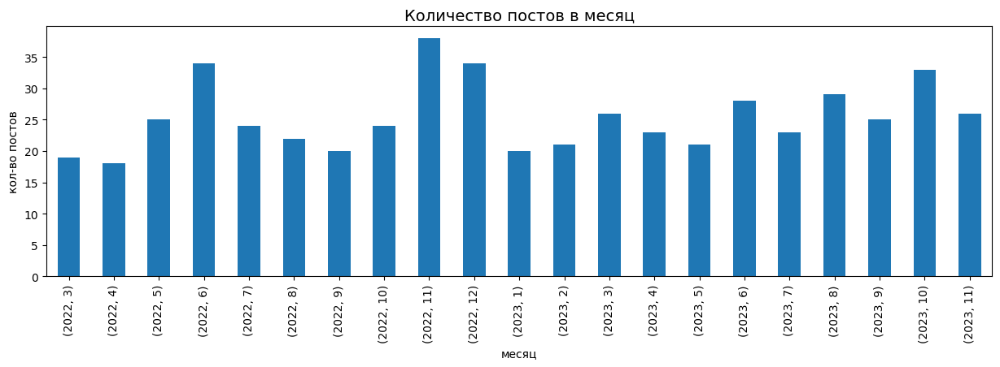

In [26]:
df_grouped_monthly[df_grouped_monthly.index != (2023,12)]['total_posts'].plot(kind = 'bar', figsize=(15, 4), legend = False)
plt.title("Количество постов в месяц", fontsize=14)
plt.xlabel("месяц")
plt.ylabel("кол-во постов");

In [27]:
views_total_monthly_growth = df_grouped_monthly.reset_index().pivot_table(index = 'month', columns = 'year',values = 'total_posts', aggfunc = 'mean').fillna(0)
views_total_monthly_growth ['growth_rate'] = (views_total_monthly_growth [2023]/views_total_monthly_growth [2022]-1).map(lambda x: '{0:.1%}'.format(x))
views_total_monthly_growth.loc[12,'growth_rate'] =0
views_total_monthly_growth

year,2022,2023,growth_rate
month,,,
1,0.0,20.0,inf%
2,0.0,21.0,inf%
3,19.0,26.0,36.8%
4,18.0,23.0,27.8%
5,25.0,21.0,-16.0%
6,34.0,28.0,-17.6%
7,24.0,23.0,-4.2%
8,22.0,29.0,31.8%
9,20.0,25.0,25.0%


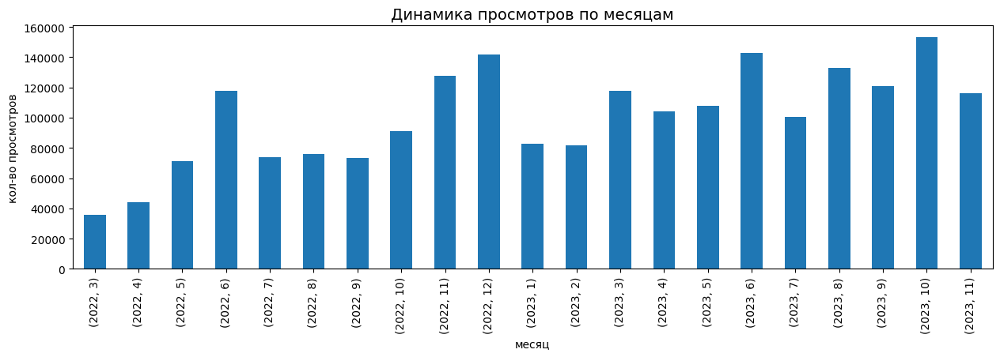

In [28]:
df_grouped_monthly[df_grouped_monthly.index != (2023,12)]['views_total'].plot(kind = 'bar', figsize=(15, 4), legend = False)
plt.title("Динамика просмотров по месяцам", fontsize=14)
plt.xlabel("месяц")
plt.ylabel("кол-во просмотров");


In [29]:
views_total_monthly_growth = df_grouped_monthly.reset_index().pivot_table(index = 'month', columns = 'year',values = 'views_total', aggfunc = 'mean').fillna(0)
views_total_monthly_growth ['growth_rate'] = (views_total_monthly_growth [2023]/views_total_monthly_growth [2022]-1).map(lambda x: '{0:.1%}'.format(x))
views_total_monthly_growth.loc[12,'growth_rate'] =0
views_total_monthly_growth

year,2022,2023,growth_rate
month,,,
1,0.0,82641.0,inf%
2,0.0,81740.0,inf%
3,35945.0,117970.0,228.2%
4,43866.0,104370.0,137.9%
5,71461.0,108025.0,51.2%
6,117864.0,142834.0,21.2%
7,74006.0,100714.0,36.1%
8,75787.0,133049.0,75.6%
9,73549.0,121116.0,64.7%


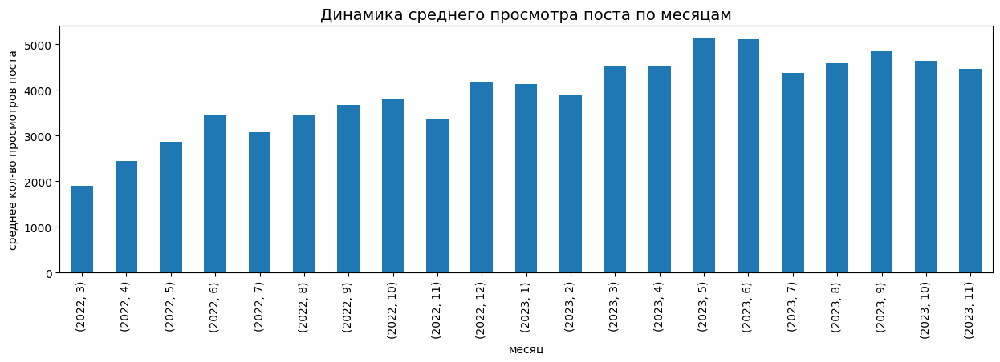

In [30]:
df_grouped_monthly[df_grouped_monthly.index != (2023,12)] ['views_avg'].plot(kind = 'bar', figsize=(15, 4), legend = False)
plt.title("Динамика среднего просмотра поста по месяцам", fontsize=14)
plt.xlabel("месяц")
plt.ylabel("среднее кол-во просмотров поста");


In [31]:
views_total_monthly_growth = df_grouped_monthly.reset_index().pivot_table(index = 'month', columns = 'year',values = 'views_avg', aggfunc = 'mean').fillna(0).round(2)
views_total_monthly_growth ['growth_rate'] = (views_total_monthly_growth [2023]/views_total_monthly_growth [2022]-1).map(lambda x: '{0:.1%}'.format(x))
views_total_monthly_growth.loc[12,'growth_rate'] =0
views_total_monthly_growth

year,2022,2023,growth_rate
month,,,
1,0.00,4132.05,inf%
2,0.00,3892.38,inf%
3,1891.84,4537.31,139.8%
4,2437.00,4537.83,86.2%
5,2858.44,5144.05,80.0%
6,3466.59,5101.21,47.2%
7,3083.58,4378.87,42.0%
8,3444.86,4587.90,33.2%
9,3677.45,4844.64,31.7%


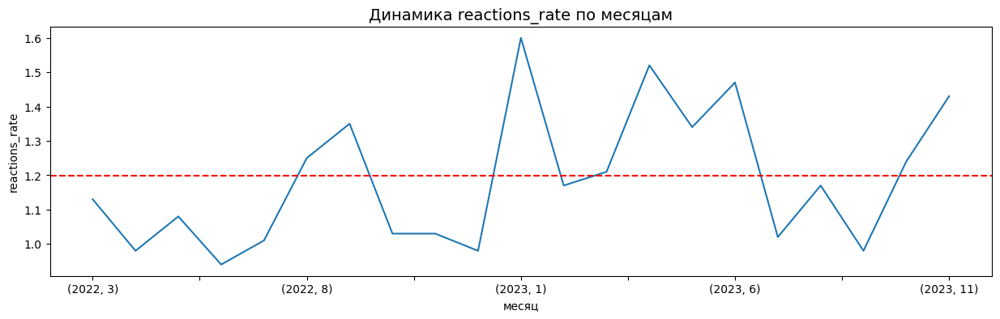

In [32]:
df_grouped_monthly[df_grouped_monthly.index != (2023,12)] ['reactions_rate'].plot(figsize=(15, 4), legend = False)    # в декабре 2023 маленькая выборка, данные нерепрезентативны
plt.title("Динамика reactions_rate по месяцам", fontsize=14)
plt.xlabel("месяц")
plt.ylabel("reactions_rate")
plt.axhline (y=(df['reactions_count'].sum()/df['views'].sum())*100,color='red', linestyle='--');

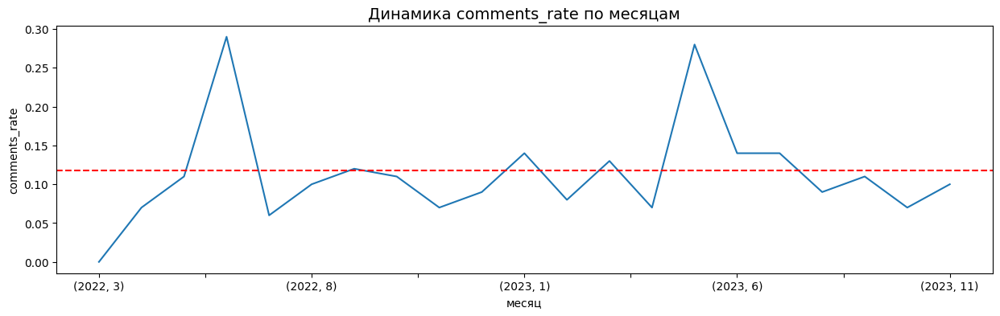

In [33]:
df_grouped_monthly[df_grouped_monthly.index != (2023,12)] ['comments_rate'].plot(figsize=(15, 4), legend = False)    # в декабре 2023 маленькая выборка, данные нерепрезентативны
plt.title("Динамика comments_rate по месяцам", fontsize=14)
plt.xlabel("месяц")
plt.ylabel("comments_rate")
plt.axhline (y=(df['comments'].sum()/df['views'].sum())*100,color='red', linestyle='--');

**Выводы по динамике показателей по месяцам:**

*   в данных не обнаружено сезонности ни в количестве постов, ни в поведении аудитории (просмотры, реакции и комментарии). Колебания показателей скорее всего связаны с наличием или отсутствием ярких инфоповодов в канале.
*   в начале периода (март-апрель) есть большая динамика роста в 2023 по сравнению с 2022. Это связано с низкой базой в начале 2022 года, когда канал был только создан. Начиная с лета темп динамики замедляется



### Динамика по неделям

In [34]:
df_grouped_weekly = df.groupby(['year','week'])[['views','reactions_count','comments']].agg(['count','sum','mean'])
df_grouped_weekly.drop([('reactions_count', 'count'), ('comments', 'count')], axis= 1 , inplace= True )
df_grouped_weekly.columns = ['total_posts','views_total','views_avg', 'reactions_total', 'reactions_avg', 'comments_total', 'comments_avg']
df_grouped_weekly ['reactions_rate'] = (df_grouped_weekly ['reactions_total']/df_grouped_weekly ['views_total']*100).round(2)
df_grouped_weekly ['comments_rate'] = (df_grouped_weekly ['comments_total']/df_grouped_weekly ['views_total']*100).round(2)
df_grouped_weekly.head()

total_posts  views_total    views_avg  reactions_total  \
year week                                                           
2022 9               8       9909.0  1238.625000               94   
     10              1       2156.0  2156.000000                9   
     11              5      10884.0  2176.800000              147   
     12              3       9331.0  3110.333333              101   
     13              3       8095.0  2698.333333               68   

           reactions_avg  comments_total  comments_avg  reactions_rate  \
year week                                                                
2022 9         11.750000               0           0.0            0.95   
     10         9.000000               0           0.0            0.42   
     11        29.400000               0           0.0            1.35   
     12        33.666667               0           0.0            1.08   
     13        22.666667               0           0.0            0.84   

           comments_rate  
year week                 
2022 9               0.0  
     10              0.0  
     11              0.0  
     12              0.0  
     13              0.0

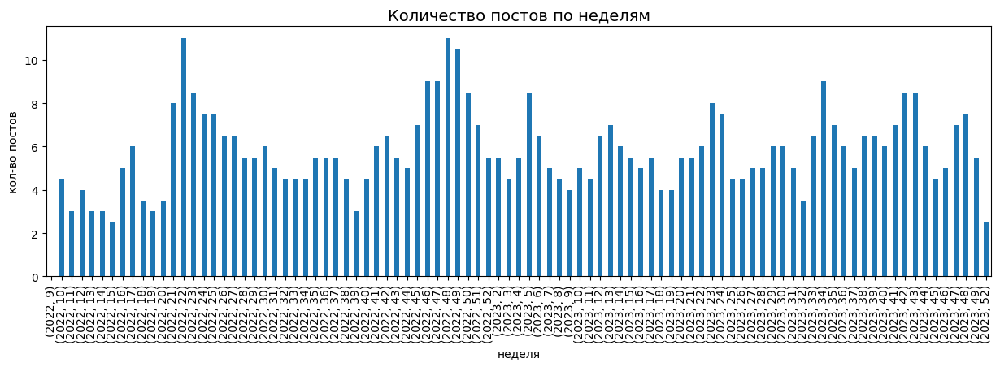

In [35]:
df_grouped_weekly['total_posts'].rolling(2).mean().plot(kind= 'bar',figsize=(15, 4), legend = False)
plt.title("Количество постов по неделям", fontsize=14)
plt.xlabel("неделя")
plt.ylabel("кол-во постов");

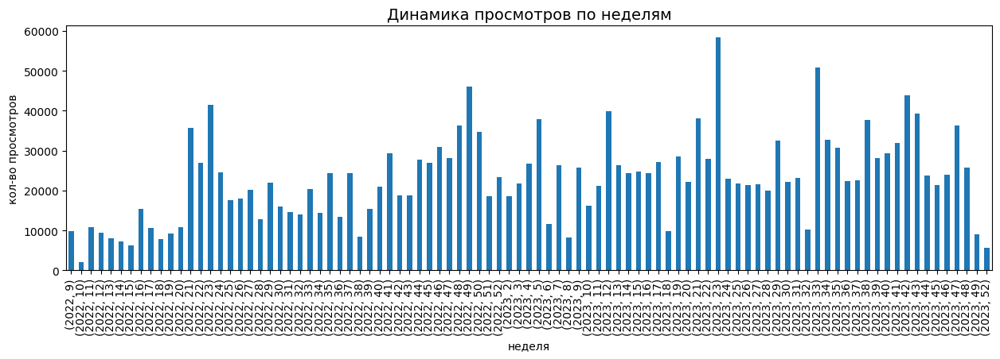

In [36]:
df_grouped_weekly['views_total'].plot(kind = 'bar', figsize=(15, 4), legend = False)
plt.title("Динамика просмотров по неделям", fontsize=14)
plt.xlabel("неделя")
plt.ylabel("кол-во просмотров");

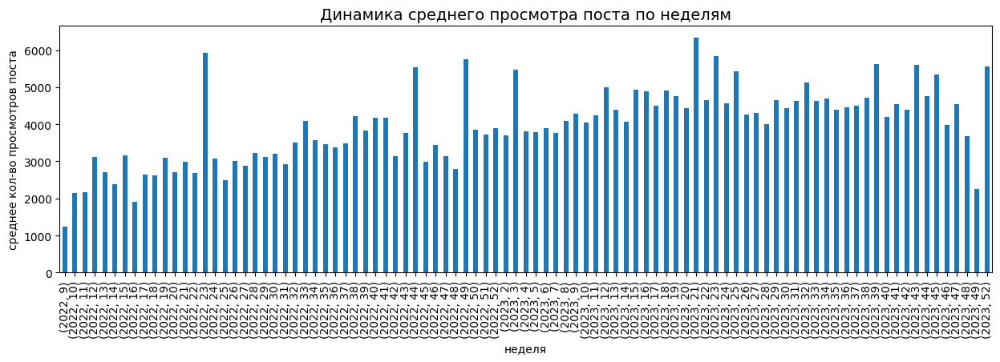

In [37]:
df_grouped_weekly['views_avg'].plot(kind = 'bar', figsize=(15, 4), legend = False)
plt.title("Динамика среднего просмотра поста по неделям", fontsize=14)
plt.xlabel("неделя")
plt.ylabel("среднее кол-во просмотров поста");

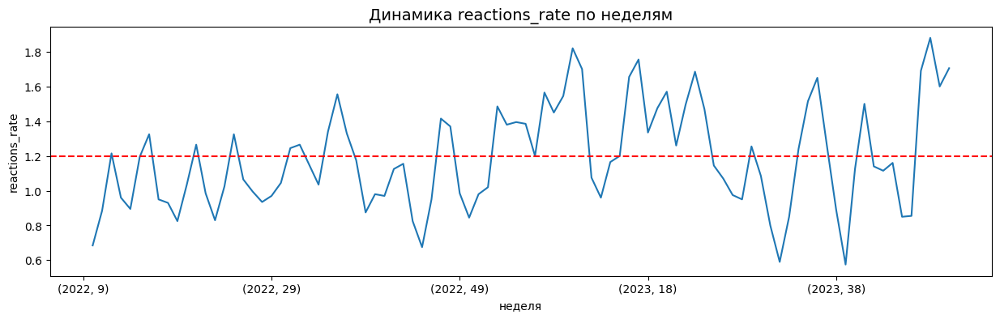

In [38]:
df_grouped_weekly ['reactions_rate'].rolling(2).mean().plot(figsize=(15, 4), legend = False)
plt.title("Динамика reactions_rate по неделям", fontsize=14)
plt.xlabel("неделя")
plt.ylabel("reactions_rate")
plt.axhline (y=(df['reactions_count'].sum()/df['views'].sum())*100,color='red', linestyle='--');

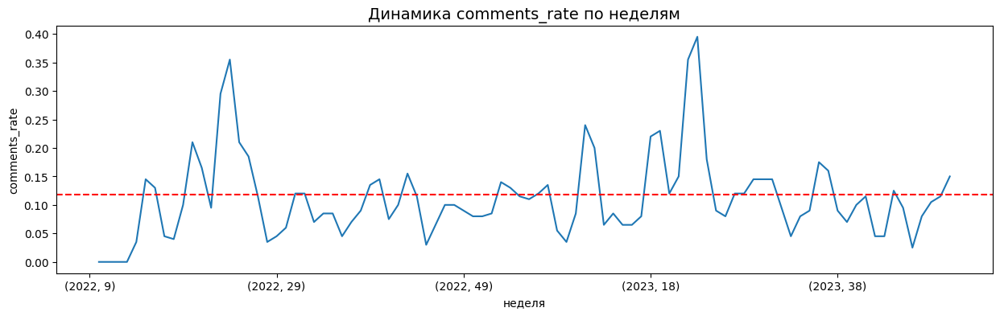

In [39]:
df_grouped_weekly ['comments_rate'].rolling(2).mean().plot(figsize=(15, 4), legend = False)
plt.title("Динамика comments_rate по неделям", fontsize=14)
plt.xlabel("неделя")
plt.ylabel("comments_rate")
plt.axhline (y=(df['comments'].sum()/df['views'].sum())*100,color='red', linestyle='--');

**Выводы по динамике недельных показателей:**

* на агрегированных данных за большой период видна динамика reactions_rate, что означает что реакции растут больше, чем просмотры.
*   однако, при наблюдении за понедельной динамикой reations_rate и comments_rate видно, что несмотря на большие колебания, долгосрочной тенденции к росту этих показателей нет, показатели колеблются вокруг среднего значения
*   т.е. в среднем количество реакций и комментариев увеличивается вслед за ростом просмотров примерно с такой же динамикой

**Общие выводы по основным статистикам:**


*   На канале есть органический рост просмотров, связанный с постоянным притоком новых подписчиков
*   Среднее значение количества просмотров одного поста в 2023 году - 4 650
*   Реакции и комментарии растут вслед за просмотрами: reactions_rate - 1.2%, comments_rate - 0.11%
*   На будущий период стоит ожидать продолжения органического роста просмотров вслед за увеличением числа подписчиков + 30% к аналогичному периоду предыдущего года

## Анализ по типам постов

In [40]:
type_grouped = df.groupby('type_attachment').agg({'id': 'count', 'views': 'median','reactions_count': 'median','comments': 'median'})
type_grouped

,id,views,reactions_count,comments
type_attachment,,,,
MessageMediaDocument,50,4037.0,67.5,5.0
MessageMediaPhoto,433,3869.0,31.0,2.0
MessageMediaWebPage,8,4049.5,30.0,3.5
MessageText,48,2577.5,15.5,0.0


**Выводы по типу постов:**

 Наиболее эффективный формат публикации - пост с Видео. По нему самые высокие показатели по всем основным метрикам.
 Наименее эффективный формат - только текст. Имеет самые низкие показатели по всем метрикам.

 Средние показатели  - у поста с Фото. На этот формат приходится 80% всех публикаций


## Анализ по времени публикации

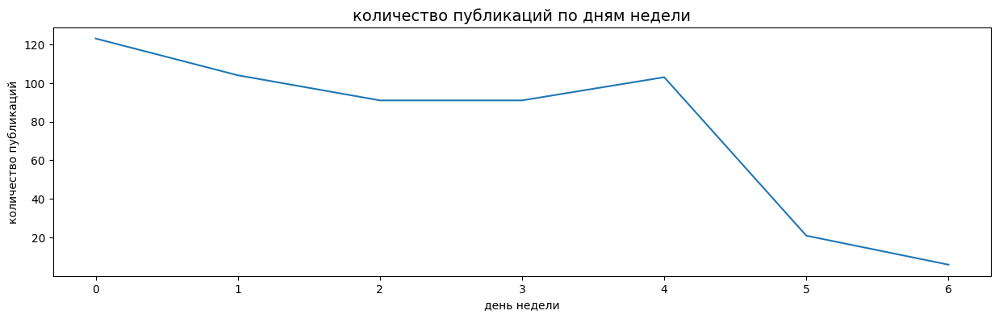

In [41]:
df.groupby('week_day')['views'].count().plot(figsize=(15, 4), legend = False)
plt.title("количество публикаций по дням недели", fontsize=14)
plt.xlabel("день недели")
plt.ylabel("количество публикаций");

In [42]:
time_slot_activity = df.pivot_table(index = 'hour', columns = 'week_day', values = 'views', aggfunc = 'count').fillna(0).round(0)


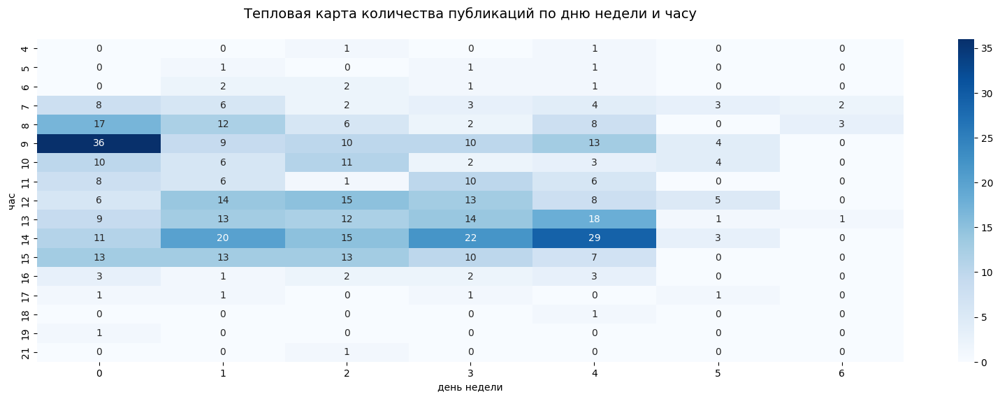

In [43]:
plt.figure(figsize = (20, 6))
sns.heatmap (time_slot_activity, annot=True, fmt='.5g',  cmap='Blues')
plt.title('Тепловая карта количества публикаций по дню недели и часу\n',  fontsize=14)
plt.ylabel("час")
plt.xlabel("день недели");

In [44]:
 # так как данные содержат некоторое количество постов с аномально высокими просмотрами, скроем их из анализа по временным интервалам, чтобы лучше видеть средние тенденции (99 процентиль)
np.percentile(df ['views'], [90, 95, 99])

array([ 5508.6 ,  6138.1 , 11460.04])

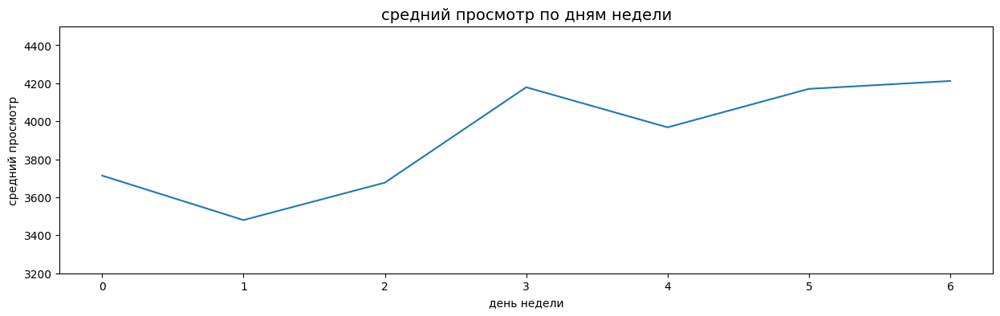

In [45]:
df[df['views'] < float(np.percentile(df ['views'], [99]))].groupby('week_day')['views'].median().plot(figsize=(15, 4), legend = False)
plt.title("средний просмотр по дням недели", fontsize=14)
plt.xlabel("день недели")
plt.ylabel("средний просмотр")
plt.ylim(3200,4500);

In [46]:
time_slot_viewership = df[df['views'] < float(np.percentile(df ['views'], [99]))].pivot_table(index = 'hour', columns = 'week_day', values = 'views', aggfunc = 'median').fillna(0).round(0)


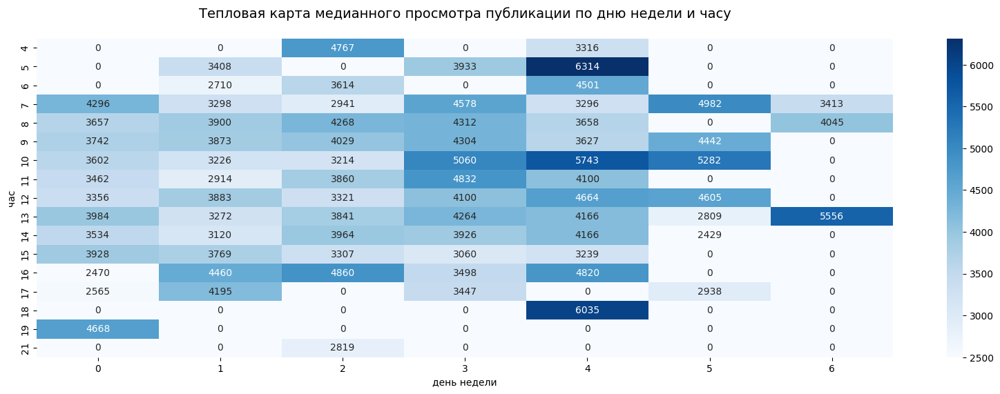

In [47]:
plt.figure(figsize = (20, 6))
sns.heatmap (time_slot_viewership, annot=True, fmt='.5g', cmap='Blues', vmin=2500)
plt.title('Тепловая карта медианного просмотра публикации по дню недели и часу\n',  fontsize=14)
plt.ylabel("час")
plt.xlabel("день недели");

**Выводы по времени публикаций:**

Публикации в канале размещаются преимущественно в будние дни в интервале с 7 до 15 часов. Самое большое количество публикаций приходится на понедельник. Размещение в выходные практически отсутствует

Средние просмотры постов в понедельник самые низкие и нарастают к концу недели. Четверг и пятница - самые высокие по просмотрам. В выходные постов немного, но они так же имеют хорошие показатели по просмотрам.

---
**Рекомендации по оптимизации времени выхода постов**:

Опираясь на данные, стоит проверить следующие гипотезы по повышению просмотров постов на канале:

*   в течение недели перераспределить посты, сократив количество публикаций в понедельник, усилив четверг и пятницу
*   рассмотреть новую возможность выхода постов в выходные в интервале с 7 до 12 часов (возможно, ввести новую рубрику для выходных)


## Анализ тематик

### Группировка по Тематикам


Группировка по тематикам носит субъективный характер.
При автоматизированном подходе группировки на тематики по ключевым словам в одну группу могут выделяться посты, которые по смыслу попадают в нескольких разных тематик (например, со словом "Университет" могут быть посты как про учебу в университете, так и новостные дайджесты, и даже некоторые посты развлекательного характера). Для распределения постов по тематикам применили распределение "вручную" исходя из логики, принятой совместно с маркетологами.

In [48]:
#df[(df['theme'] =="undef") & (df['text'].str.contains("университет"))]['id'].unique()
#df[(df['theme'] =="undef") & (df['text'].str.contains("университет"))]

In [49]:
vacances = [82, 84, 93, 201, 235, 236, 237, 263, 297, 331, 349, 405, 424, 452, 459, 484, 514, 555, 598, 644,
            679, 713, 718, 750, 764, 782, 805, 833, 861, 883, 907, 935, 1023, 1047, 1080, 1104, 1203, 1219, 1266, 1274,
            1317, 1343, 1377]  # Вакансии в Иннополисе
news_digest = [32, 34, 37, 50, 73, 78, 91, 102, 114, 123, 148, 150, 166, 192, 200, 204, 220, 233, 234, 241,
          242, 256, 265, 285, 290, 299, 306, 334, 346, 351, 383, 384, 396, 412, 415, 420, 431, 445, 466,
          480, 486, 489, 500, 519, 542, 571, 593, 617, 643, 660, 661, 672, 681, 706, 726, 734, 752, 760, 766,
          780, 786, 801, 818, 827, 836, 849, 863, 881, 885, 906, 914, 932, 972, 991, 996, 1015, 1024, 1039, 1049,
          1066, 1086, 1093, 1119, 1144, 1175, 1191, 1205, 1218, 1261, 1276, 1302, 1320, 1339, 1350, 1370, 1389, 1414]  # Дайджесты новостей
university = [42, 51, 83, 106, 198, 249, 250, 367, 382, 399, 400, 468, 513, 537, 586, 592, 642, 670, 693,
              705, 707, 728, 838, 850, 910, 1002, 1021, 1022, 1033, 1040, 1162, 1168, 1190, 1213, 1256, 1282, 1308, 1381] # Университет (учеба)
events = [28, 131, 153, 163, 169, 182, 199, 205, 212, 221, 227, 266, 337, 352, 357, 580, 606, 627, 819, 826, 828,
          875, 909, 929, 930, 936, 944, 951, 962, 997, 1025, 1034, 1041, 1046, 1050, 1077, 1081, 1087, 1094,
          1102, 1103, 1115, 1118, 1120, 1132, 1138, 1139, 1145, 1151, 1153, 1176, 1192, 1215, 1227, 1262, 1277,
          1281, 1303, 1321, 1340, 1355, 1361, 1371, 1390, 1404, 1406, 1415, 1420] # Мероприятия Иннополиса
business_events = [43, 53, 60, 62, 94, 143, 243, 244, 313, 406, 435, 460, 482, 492, 495, 501, 517, 523, 527, 535,
                   546, 548, 551, 568, 569, 715, 719, 787, 792, 798, 799, 802, 888, 893, 896, 1112, 1127, 1207, 1220, 1225,
                   1226, 1239, 1273, 1275, 1284, 1293, 1294, 1309, 1344, 1379, 1395, 1403, 1407]    # Бизнес мероприятия Иннополиса
celebrate = [167, 175, 177, 404, 648, 735, 762, 763, 767, 824, 876, 920, 1197, 1245, 1421] # Праздничные даты
real_life = [52, 162, 276, 433, 446, 682, 882, 915, 1189, 1376]  # Жизнь города (фотки от жителей)
innovations = [21, 36, 48, 49, 61, 67, 103, 104, 120, 133, 146, 168, 176, 253, 282, 291, 300, 324, 325, 414, 417,
               418, 419, 423, 456, 477, 520, 536, 543, 565, 566, 589, 597, 645, 704, 727, 788, 823, 854, 933, 1058,
               1100, 1206, 1208, 1228, 1280, 1283, 1316, 1333, 1351, 1369, 1378] # Достижения Иннополиса (разработки и стартапы)
entertainment = [31, 77, 81, 101, 105, 112, 115, 122, 124, 129, 130, 134, 135, 147, 149, 161, 164, 165, 202, 206,
                 240, 264, 277, 281, 284, 298, 318, 332, 333, 335, 336, 339, 350, 366, 376, 385, 395, 421, 425, 436,
                 437, 479, 483, 485, 487, 488, 502, 511, 512, 516, 528, 547, 556, 567, 578, 590, 596, 599, 603, 604,
                 646, 647, 663, 664, 680, 687, 708, 709, 711, 725, 741, 747, 748, 751, 753, 761, 765, 777, 779, 781,
                 784, 785, 797, 806, 809, 834, 835, 837, 840, 841, 855, 862, 865, 884, 905, 912, 913, 934, 952, 961,
                 973, 984, 985, 986, 992, 995, 1004, 1005, 1016, 1032, 1048, 1060, 1067, 1105, 1126, 1150, 1180, 1204,
                 1216, 1217, 1230, 1260, 1272, 1301, 1319, 1324, 1338, 1368] # Легкие развлекательные посты, мемы, плейлисты, обои, "айтишный для начинающих"
expertise = [35, 64, 65, 74, 257, 348, 490, 491, 494, 572, 634, 789, 1056, 1114, 1273] # Экспертное мнение
city_development = [44, 63, 68, 136, 152, 193, 401, 432, 434, 467, 521, 605, 618, 659, 673, 703, 808, 820, 917, 993, 1045, 1382] # Развитие инфраструктуры Иннополиса (строительство)


In [50]:
df['theme'] = 'undef'
df.loc[df['id'].isin(vacances), 'theme'] = 'vacances'
df.loc[df['id'].isin(news_digest), 'theme'] = 'news_digest'
df.loc[df['id'].isin(university), 'theme'] = 'university'
df.loc[df['id'].isin(events), 'theme'] = 'events'
df.loc[df['id'].isin(business_events), 'theme'] = 'business_events'
df.loc[df['id'].isin(celebrate), 'theme'] = 'celebrate'
df.loc[df['id'].isin(real_life), 'theme'] = 'real_life'
df.loc[df['id'].isin(innovations), 'theme'] = 'innovations'
df.loc[df['id'].isin(entertainment), 'theme'] = 'entertainment'
df.loc[df['id'].isin(expertise), 'theme'] = 'expertise'
df.loc[df['id'].isin(city_development), 'theme'] = 'city_development'

themes_rank = df['theme'].value_counts().reset_index()
themes_rank.columns = ['theme', 'total_posts']
themes_rank

,theme,total_posts
0,entertainment,128
1,news_digest,97
2,events,68
3,business_events,52
4,innovations,51
5,vacances,43
6,university,38
7,city_development,22
8,celebrate,15
9,expertise,15


In [51]:
df_grouped_themes = df.groupby(['theme'])[['views','reactions_count','comments']].agg(['count','sum','median'])
df_grouped_themes.drop([('reactions_count', 'count'), ('comments', 'count')], axis= 1 , inplace= True )
df_grouped_themes.columns = ['total_posts','views_total','views_avg', 'reactions_total', 'reactions_avg', 'comments_total', 'comments_avg']
df_grouped_themes ['reactions_rate'] = (df_grouped_themes ['reactions_total']/df_grouped_themes ['views_total']*100).round(2)
df_grouped_themes ['comments_rate'] = (df_grouped_themes ['comments_total']/df_grouped_themes ['views_total']*100).round(2)
df_grouped_themes =df_grouped_themes.sort_values(by = 'total_posts', ascending = False)
df_grouped_themes

,total_posts,views_total,views_avg,reactions_total,reactions_avg,comments_total,comments_avg,reactions_rate,comments_rate
theme,,,,,,,,,
entertainment,128,506323.0,3907.5,7822,50.0,793,4.0,1.54,0.16
news_digest,97,326596.0,3359.0,1936,19.0,135,0.0,0.59,0.04
events,68,300762.0,4007.0,3648,37.5,369,3.0,1.21,0.12
business_events,52,227293.0,4197.5,1310,23.5,93,0.0,0.58,0.04
innovations,51,190256.0,3608.0,2764,44.0,173,0.0,1.45,0.09
vacances,43,178554.0,4306.0,1024,22.0,162,3.0,0.57,0.09
university,38,154249.0,3796.0,2719,69.5,189,3.0,1.76,0.12
city_development,22,90603.0,3418.0,1515,61.0,169,5.5,1.67,0.19
celebrate,15,71980.0,4195.0,1282,89.0,194,4.0,1.78,0.27


### Анализ Тематик по количеству просмотров

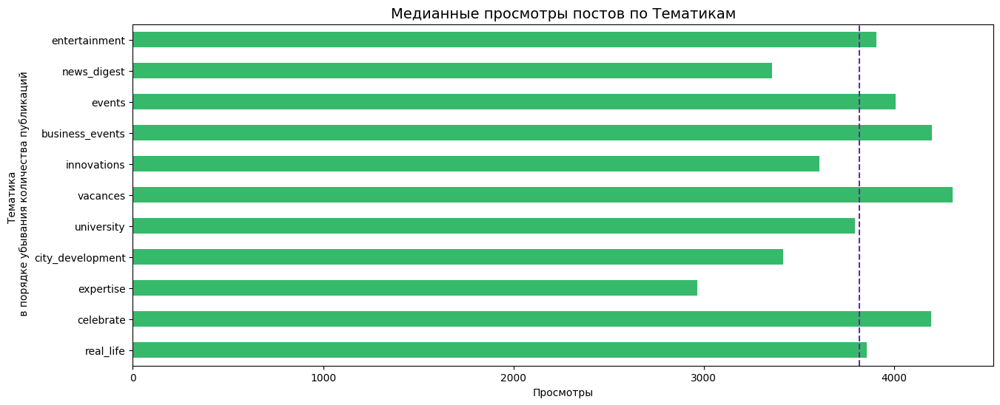

In [52]:
df_grouped_themes.sort_values(by = 'total_posts', ascending = True)['views_avg'].plot(kind = 'barh', color  = "#36B96B",  figsize=(15, 6))
plt.title("Медианные просмотры постов по Тематикам", fontsize=14)
plt.xlabel("Просмотры")
plt.ylabel("Тематика \n в порядке убывания количества публикаций")
plt.axvline (x=df['views'].median() ,color='#692B9E', linestyle='--');

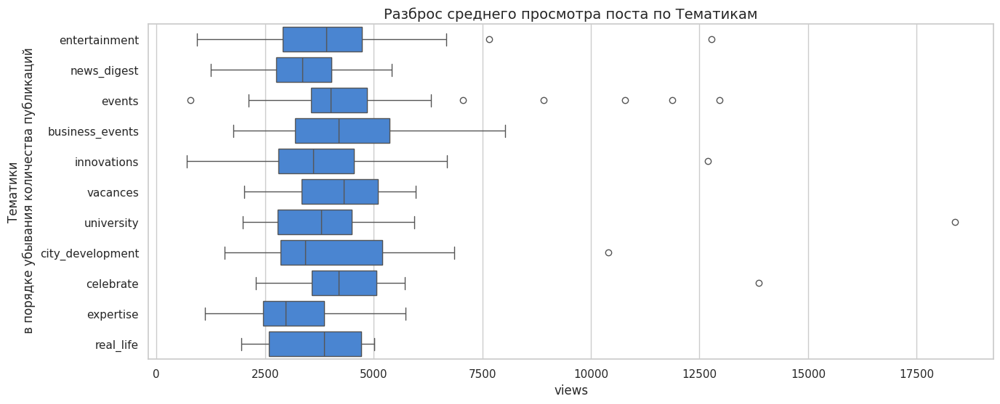

In [53]:

sns.set(rc={'figure.figsize':(15,6)})
palette = ["#3482E7"]
sns.set_style('whitegrid')
ax = sns.boxplot(y='theme', x='views', data=df , palette=palette, order = themes_rank ['theme'])
ax.set_title( "Разброс среднего просмотра поста по Тематикам" , size = 14 )
ax.set_ylabel( "Тематики\n в порядке убывания количества публикаций" , size = 12 );

**Выводы по тематикам с точки зрения среднего количества просмотров:**

Просмотры Выше среднего в тематиках:

*   Events - есть посты рекордсмены
*   Business_events
*   Vacances
*   Celebrate

Просмотры на уровне Среднего в тематиках:

*   Enterteinment - есть посты рекордсмены
*   University - есть посты рекордсмены
*   Real_life

Просмотры на уровне Ниже cреднего в тематиках:

*   New_digest
*   Innovations - есть посты рекордсмены
*   City_development - есть посты рекордсмены
*   Expertise

#### Посты - лидеры по количеству просмотров

In [54]:
df.query('theme == "entertainment" & views > 7500')[['theme','id','date','text']]

,theme,id,date,text
172,entertainment,913,2023-05-27 07:10:40+00:00,"Если ты вдруг не в Иннополисе, но очень скучае..."
351,entertainment,483,2022-11-02 13:50:19+00:00,В новом сезоне откроется история великого Дома...


In [55]:
df.query('theme == "events" & views > 7000')[['theme','id','date','text']]

,theme,id,date,text
161,events,936,2023-06-07 13:17:56+00:00,Долгожданный формат уютного дня города вернулс...
175,events,909,2023-05-25 11:45:01+00:00,"Динь-динь!\nЭто напоминание, что до Дня рожден..."
305,events,580,2022-12-07 12:00:01+00:00,Новый год всё ближе. Собрали карточки с главны...
466,events,169,2022-06-08 10:00:27+00:00,2022: mission complete 🥳
487,events,131,2022-05-24 13:28:38+00:00,Первый юбилей Иннополиса\n\n9 июня будет 10 ле...


In [56]:
df.query('theme == "innovations" & views > 7000')[['theme','id','date','text']]

,theme,id,date,text
36,innovations,1316,2023-10-25 09:05:19+00:00,**В Иннополисе беспилотный автомобиль Яндекса ...


In [57]:
df.query('theme == "university" & views > 7000')[['theme','id','date','text']]

,theme,id,date,text
301,university,592,2022-12-10 07:02:21+00:00,[Университету Иннополис](https://t.me/universi...


In [58]:
df.query('theme == "city_development" & views > 7000')[['theme','id','date','text']]

,theme,id,date,text
273,city_development,673,2023-01-16 13:33:54+00:00,"Иннополис – город, который ведет дневник счаст..."


In [59]:
df.query('theme == "celebrate" & views > 7000')[['theme','id','date','text']]

,theme,id,date,text
465,celebrate,175,2022-06-09 06:02:09+00:00,"Доброе утро, любимый город!\n\nСегодня у нас с..."


### Анализ Тематик по уровню Реакций

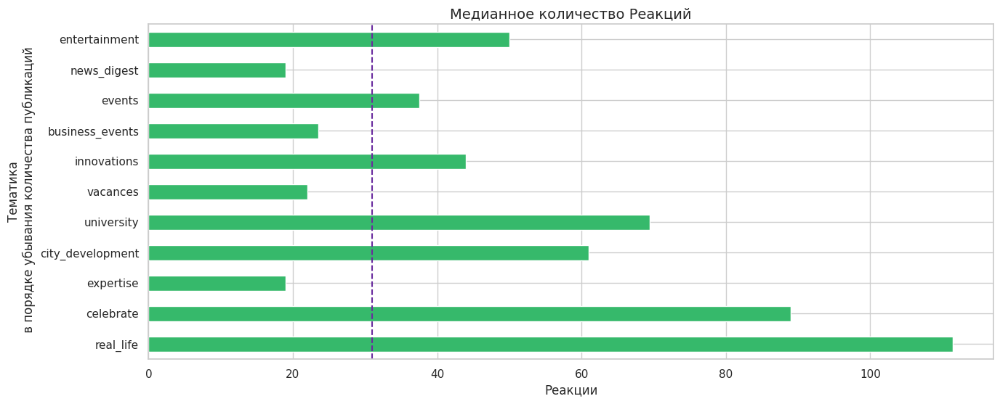

In [60]:
df_grouped_themes.sort_values(by = 'total_posts', ascending = True)['reactions_avg'].plot(kind = 'barh', color  = "#36B96B",  figsize=(15, 6))
plt.title("Медианное количество Реакций", fontsize=14)
plt.xlabel("Реакции")
plt.ylabel("Тематика\n в порядке убывания количества публикаций")
plt.axvline (x=df['reactions_count'].median() ,color='#692B9E', linestyle='--');

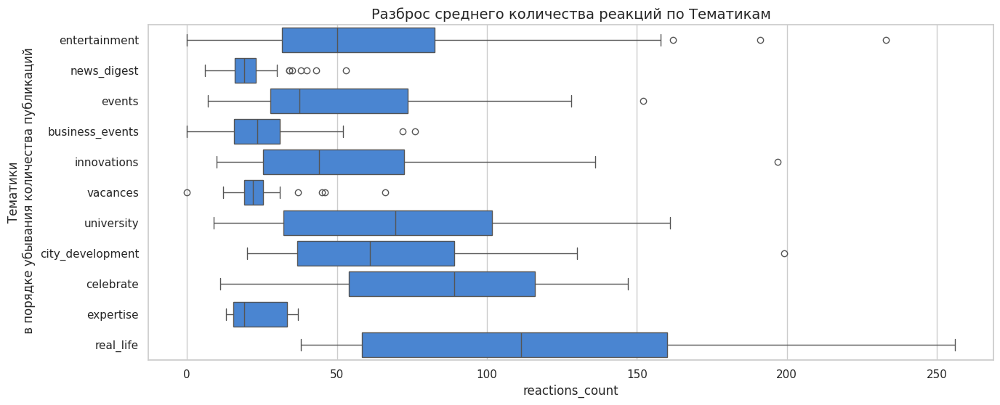

In [61]:
sns.set(rc={'figure.figsize':(15,6)})
palette = ["#3482E7"]
sns.set_style('whitegrid')
ax = sns.boxplot(y='theme', x='reactions_count', data=df , palette=palette, order = themes_rank ['theme'])
ax.set_title( "Разброс среднего количества реакций по Тематикам" , size = 14 )
ax.set_ylabel( "Тематики\n в порядке убывания количества публикаций" , size = 12 );

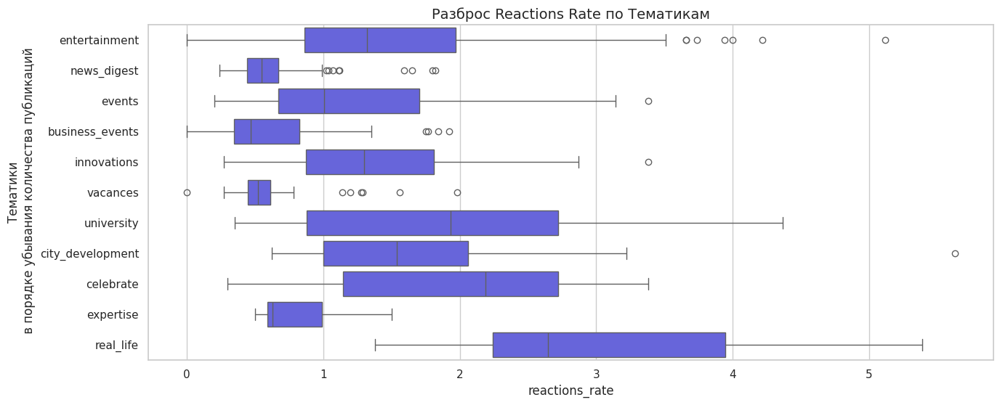

In [62]:
sns.set(rc={'figure.figsize':(15,6)})
palette = ["#5451EE"]
sns.set_style('whitegrid')
ax = sns.boxplot(y='theme', x='reactions_rate', data=df , palette=palette, order = themes_rank ['theme'])
ax.set_title( "Разброс Reactions Rate по Тематикам" , size = 14 )
ax.set_ylabel( "Тематики\n в порядке убывания количества публикаций" , size = 12 );

**Выводы по тематикам с точки зрения среднего количества реакций:**

Просмотры Выше среднего в тематиках:

*   Enterteinment - есть посты рекордсмены
*   Events - есть посты рекордсмены
*   Innovations - есть посты рекордсмены
*   University
*   City_development - есть посты рекордсмены
*   Celebrate
*   Real_life - абсолютный чемпион по реакциям!

Просмотры на уровне Ниже cреднего в тематиках:

*   New_digest
*   Business_events
*   Vacances
*   Expertise

#### Посты - лидеры по количеству реакций

In [63]:
df.query('theme == "entertainment" & reactions_count > 150')[['theme','id','date','text']]

,theme,id,date,text
54,entertainment,1272,2023-10-11 13:50:25+00:00,Телепортируемся в осенний уютный Иннополис ❤️
106,entertainment,1105,2023-08-16 16:41:53+00:00,Хвостатый митап в Иннополисе🐾
142,entertainment,1005,2023-06-30 13:10:43+00:00,Иннополис в деталях 💟\n\nКусочки футуристическ...
151,entertainment,986,2023-06-16 14:35:47+00:00,Закаты Иннополиса желают тебе хороших выходных 🌆
198,entertainment,840,2023-04-20 11:35:49+00:00,"Вот что бывает, когда пешком до школы идти 10 ..."
325,entertainment,528,2022-11-24 13:14:54+00:00,Frozen


In [64]:
df.query('theme == "events" & reactions_count > 125')[['theme','id','date','text']]

,theme,id,date,text
159,events,951,2023-06-09 05:02:21+00:00,"Доброе утро, это твой город Иннополис!\n\nСего..."
175,events,909,2023-05-25 11:45:01+00:00,"Динь-динь!\nЭто напоминание, что до Дня рожден..."


In [65]:
df.query('theme == "innovations" & reactions_count > 150')[['theme','id','date','text']]

,theme,id,date,text
36,innovations,1316,2023-10-25 09:05:19+00:00,**В Иннополисе беспилотный автомобиль Яндекса ...


In [66]:
df.query('theme == "business_events" & reactions_count > 70')[['theme','id','date','text']]

,theme,id,date,text
179,business_events,896,2023-05-19 14:15:01+00:00,Завершаем работу на форуме «Россия — Исламский...
180,business_events,893,2023-05-18 11:30:01+00:00,Иннополис сегодня на форуме «Россия — Исламски...


In [67]:
df.query('theme == "city_development" & reactions_count > 129')[['theme','id','date','text']]

,theme,id,date,text
11,city_development,1382,2023-11-24 12:02:12+00:00,"Семь фотографий — семь лет, как Руслан Ринатов..."
210,city_development,820,2023-04-04 09:35:40+00:00,5... Пять лет подряд Иннополис становится лучш...


### Анализ тематик по уровню Комментариев

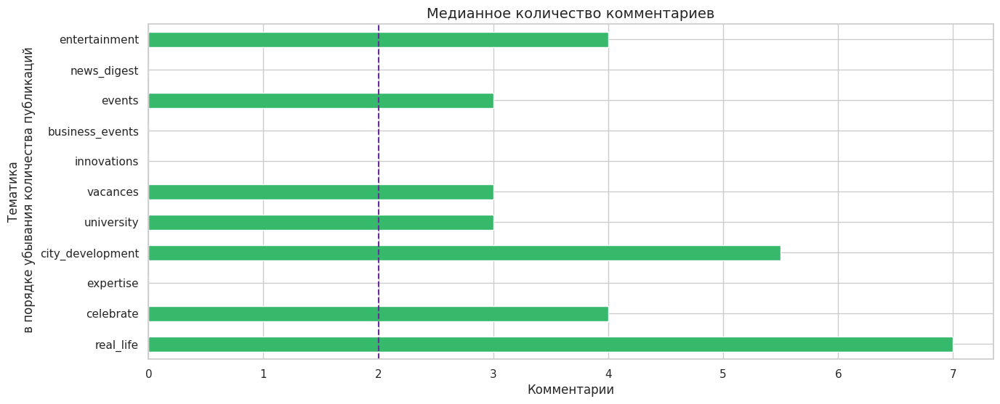

In [68]:
df_grouped_themes.sort_values(by = 'total_posts', ascending = True)['comments_avg'].plot(kind = 'barh', color  = "#36B96B",  figsize=(15, 6))
plt.title("Медианное количество комментариев", fontsize=14)
plt.xlabel("Комментарии")
plt.ylabel("Тематика\n в порядке убывания количества публикаций")
plt.axvline (x=df['comments'].median() ,color='#692B9E', linestyle='--');

''

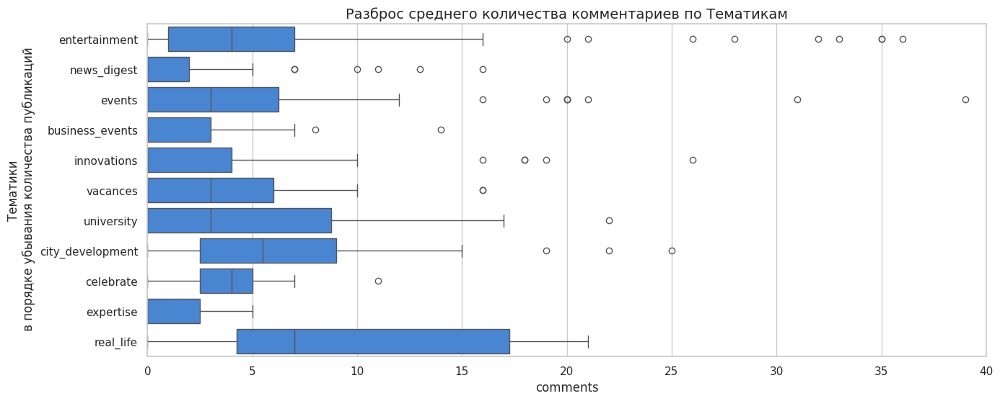

In [69]:
sns.set(rc={'figure.figsize':(15,6)})
palette = ["#3482E7"]
sns.set_style('whitegrid')
ax = sns.boxplot(y='theme', x='comments', data=df , palette=palette, order = themes_rank ['theme'])
ax.set_title( "Разброс среднего количества комментариев по Тематикам" , size = 14 )
ax.set_ylabel( "Тематики\n в порядке убывания количества публикаций" , size = 12 )
ax.set_xlim(0,40)
;

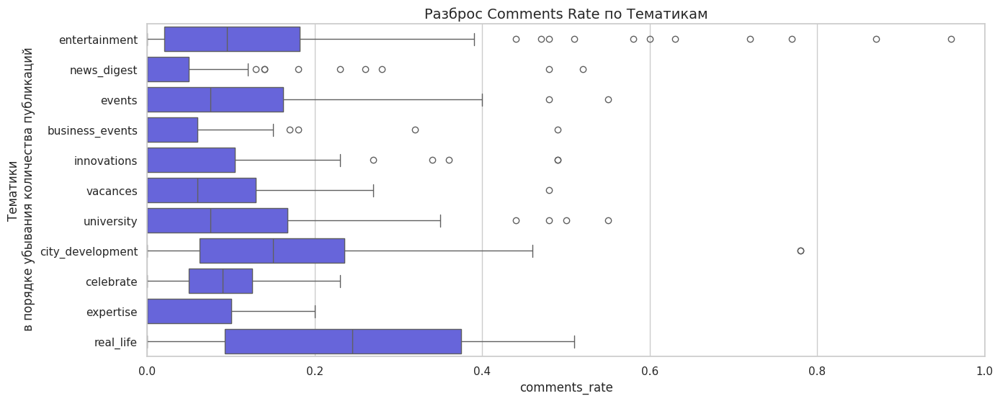

In [70]:
sns.set(rc={'figure.figsize':(15,6)})
palette = ["#5451EE"]
sns.set_style('whitegrid')
ax = sns.boxplot(y='theme', x='comments_rate', data=df , palette=palette, order = themes_rank ['theme'])
ax.set_title( "Разброс Comments Rate по Тематикам" , size = 14 )
ax.set_ylabel( "Тематики\n в порядке убывания количества публикаций" , size = 12 )
ax.set_xlim(0,1);

**Выводы по тематикам с точки зрения среднего количества комментариев**

Просмотры Выше среднего в тематиках:

*   Enterteinment - есть посты рекордсмены
*   Events - есть посты рекордсмены
*   Vacances
*   University - есть посты рекордсмены
*   City_development - есть посты рекордсмены
*   Celebrate
*   Real_life - абсолютный чемпион по реакциям!

Просмотры на уровне Ниже cреднего в тематиках:

*   New_digest
*   Business_events
*   Innovations - есть посты рекордсмены
*   Expertise

#### Посты - лидеры по количеству комментариев

In [71]:
df.query('theme == "entertainment" & comments > 18')[['theme','id','date','text']]


,theme,id,date,text
31,entertainment,1324,2023-11-01 15:21:37+00:00,Ноябрьские обои уже готовы радовать тебя своим...
62,entertainment,1230,2023-10-03 15:20:36+00:00,"Лови новые обои Иннополиса, которые скрасят тв..."
85,entertainment,1180,2023-09-05 13:52:54+00:00,Этот день настал. \n\nОбновляем летние заставк...
118,entertainment,1067,2023-08-01 14:55:44+00:00,Встречаем последний месяц лета теплыми видами ...
140,entertainment,1016,2023-07-04 09:17:08+00:00,⚠️UPD 7.23: пора обновить обои на телефоне и к...
154,entertainment,973,2023-06-13 12:33:02+00:00,Обновили обои Иннополиса на июнь 😍\n\nВсе файл...
157,entertainment,961,2023-06-09 18:11:06+00:00,Диджей-сет от мэра города Руслана Шагалеева ❤️‍🔥
189,entertainment,865,2023-05-04 11:48:53+00:00,Подготовили для тебя майские обои и заставки. ...
230,entertainment,781,2023-03-14 12:50:01+00:00,Достаём двойные листочки. В день математики пр...
314,entertainment,556,2022-12-01 12:22:21+00:00,"Если твой город не встречает зиму так красиво,..."


In [72]:
df.query('theme == "events" & comments > 15')[['theme','id','date','text']]

,theme,id,date,text
108,events,1103,2023-08-16 08:37:07+00:00,"Ты, лето, Иннополис...💔\n\nГотовимся красиво з..."
132,events,1034,2023-07-14 13:18:39+00:00,Сегодня у нас вечеринка на самой гипнотической...
156,events,962,2023-06-11 08:39:05+00:00,Любимые моменты нашего уютного праздника INN8 💜
161,events,936,2023-06-07 13:17:56+00:00,Долгожданный формат уютного дня города вернулс...
175,events,909,2023-05-25 11:45:01+00:00,"Динь-динь!\nЭто напоминание, что до Дня рожден..."
305,events,580,2022-12-07 12:00:01+00:00,Новый год всё ближе. Собрали карточки с главны...
466,events,169,2022-06-08 10:00:27+00:00,2022: mission complete 🥳
487,events,131,2022-05-24 13:28:38+00:00,Первый юбилей Иннополиса\n\n9 июня будет 10 ле...


In [73]:
df.query('theme == "innovations" & comments > 10')[['theme','id','date','text']]

,theme,id,date,text
36,innovations,1316,2023-10-25 09:05:19+00:00,**В Иннополисе беспилотный автомобиль Яндекса ...
76,innovations,1206,2023-09-19 14:36:09+00:00,⚡️**Разработали дрон для контроля дорожного дв...
164,innovations,933,2023-06-05 13:21:02+00:00,Отдельно расскажем про первую новость\n\nПочта...
377,innovations,419,2022-09-29 11:05:36+00:00,В Иннополисе появился TorchOk. Это новый open-...
464,innovations,176,2022-06-09 09:01:35+00:00,Иннополису — 7 лет. Собрали главные итоги и до...


In [74]:
df.query('theme == "business_events" & comments > 7')[['theme','id','date','text']]

,theme,id,date,text
415,business_events,313,2022-08-04 16:52:16+00:00,На этой неделе публикаций про Иннополис в разн...
438,business_events,244,2022-07-05 14:49:11+00:00,В Иннополисе прошёл DID Summer Camp\n\nЭто лет...


In [75]:
df.query('theme == "university" & comments > 17')[['theme','id','date','text']]

,theme,id,date,text
275,university,670,2023-01-11 09:45:10+00:00,"**А вы знали, что в Лицее Иннополис:**\n• 40% ..."


In [76]:
df.query('theme == "city_development" & comments > 15')[['theme','id','date','text']]

,theme,id,date,text
128,city_development,1045,2023-07-19 14:48:16+00:00,"Британские ученые доказали, что житель Иннопол..."
357,city_development,467,2022-10-25 11:17:04+00:00,[Немного цифр на сегодня](https://t.me/bezbuld...
460,city_development,193,2022-06-15 14:54:07+00:00,Недавно мы [рассказывали о строительстве новых...


In [77]:
df.query('theme == "celebrate" & comments > 7')[['theme','id','date','text']]

,theme,id,date,text
239,celebrate,762,2023-03-01 04:01:51+00:00,Из Иннополиса с любовью\n\nСегодня день рожден...
463,celebrate,177,2022-06-09 12:01:39+00:00,"Сохраняй эти карточки о сегодняшнем празднике,..."


In [78]:
df.query('theme == "real_life" & comments > 22')[['theme','id','date','text']]

,theme,id,date,text
170,real_life,915,2023-05-29 14:46:11+00:00,О классной фиче [нашего сайта](https://innopol...


**Общие выводы из анализа по Тематикам:**

*   Самые успешные тематики касаются внутренней жизни города, его развития и успехов
*   Развлекательный контент самый популярный: тематики Entertainment, Events, Сelebrate и Real_life - имеют высокие показатели как по просмотрам, так и по вовлечению аудитории
*   News_digest и Expertize - самые низкие показатели по просмотрам и вовлечению. Возможно, читателям канала не очень интересно читать контент, который не относится к Иннополису
*   Real_life - зона роста и расширения! Фото и видео от жителей вызывает большой интерес соседей. и сами жители обожают выкладывать свои фото.





### Облако Слов

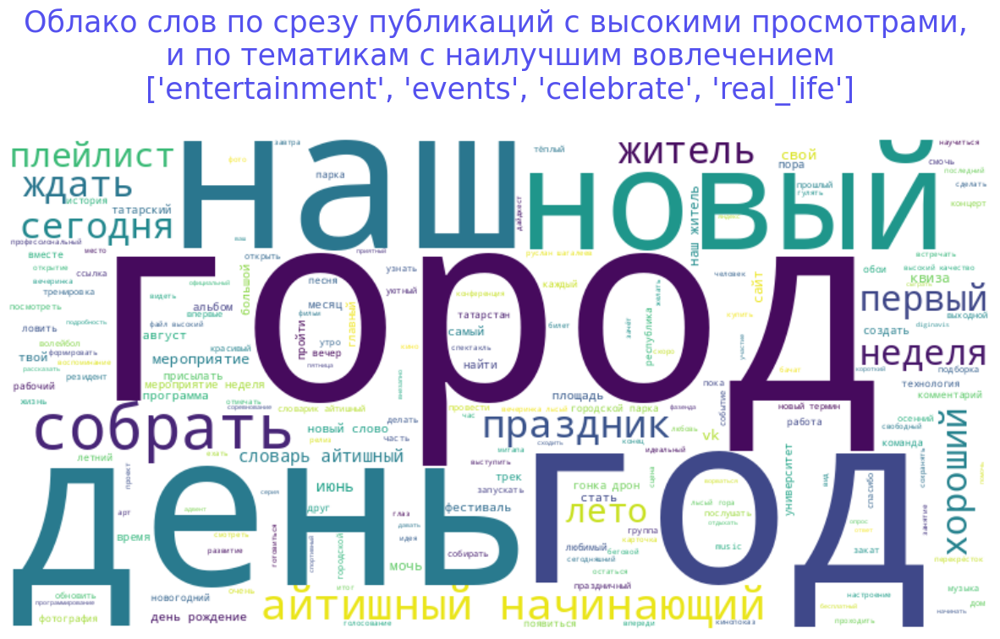

In [79]:
stop_words = set(stopwords.words('russian'))
custom_stop_words = set(['это', 'еще', 'ещё', 'все', 'всё', 'весь','ия', 'также', 'который', 'иннополис'])
stop_words = stop_words.union(custom_stop_words)

morph = pymorphy2.MorphAnalyzer()
lemmatizer = WordNetLemmatizer()

def tokenize_lemmatize_and_filter(text):
    tokens = word_tokenize(text)
    lemmatized_tokens = [lemmatizer.lemmatize(morph.parse(token)[0].normal_form) for token in tokens]
    return [token for token in lemmatized_tokens if token.lower() not in stop_words and token.isalpha()]

hot_themes = ['entertainment', 'events', 'celebrate', 'real_life']
popular_df = df.loc[(df['theme'].isin(hot_themes))&(df['views'] >=df['views']. median())]
all_text = ' '.join(popular_df['text'].tolist())
all_text = all_text.lower()

all_tokens = tokenize_lemmatize_and_filter(all_text)
text_for_wordcloud = ' '.join(all_tokens)

wordcloud = WordCloud (width= 800, height = 400, background_color = 'white').generate(text_for_wordcloud)

plt.figure(figsize = (15,10))
plt.imshow(wordcloud, interpolation = 'bilinear' )
plt.axis ('off')
plt.title(f"Облако слов по срезу публикаций с высокими просмотрами, \n и по тематикам с наилучшим вовлечением \n{hot_themes}\n" , fontsize=25, color = '#5451EE')
plt.show ()
print()
print()

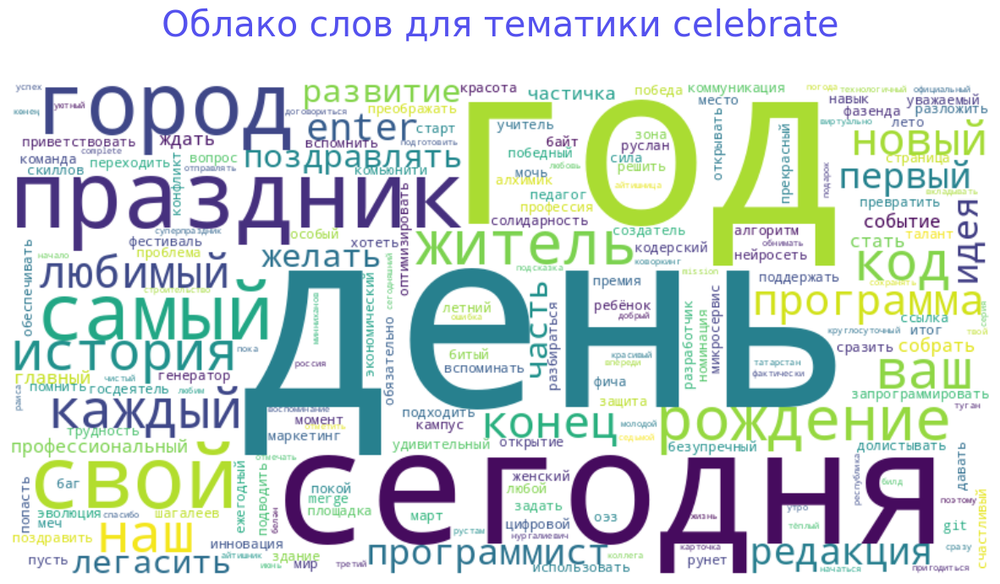

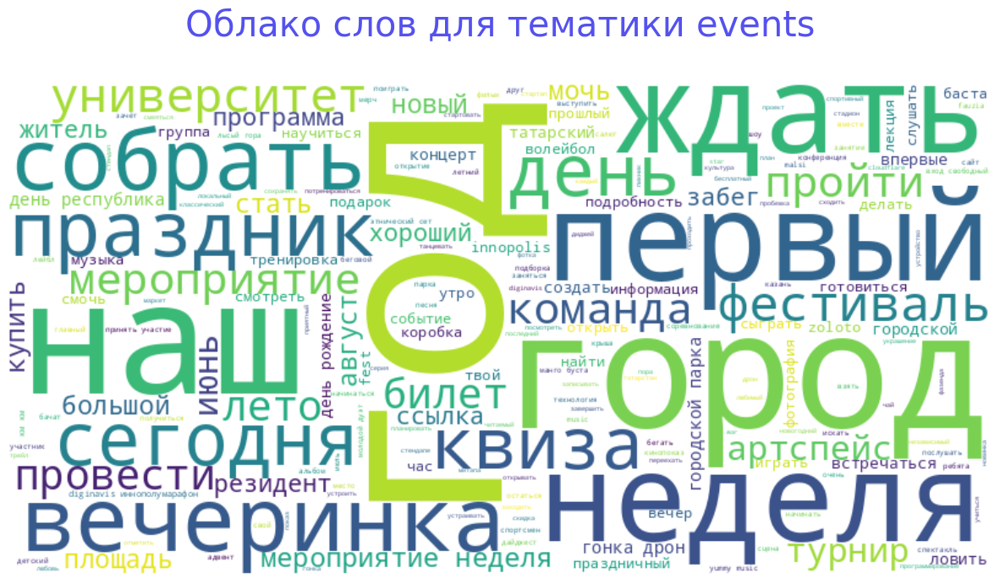

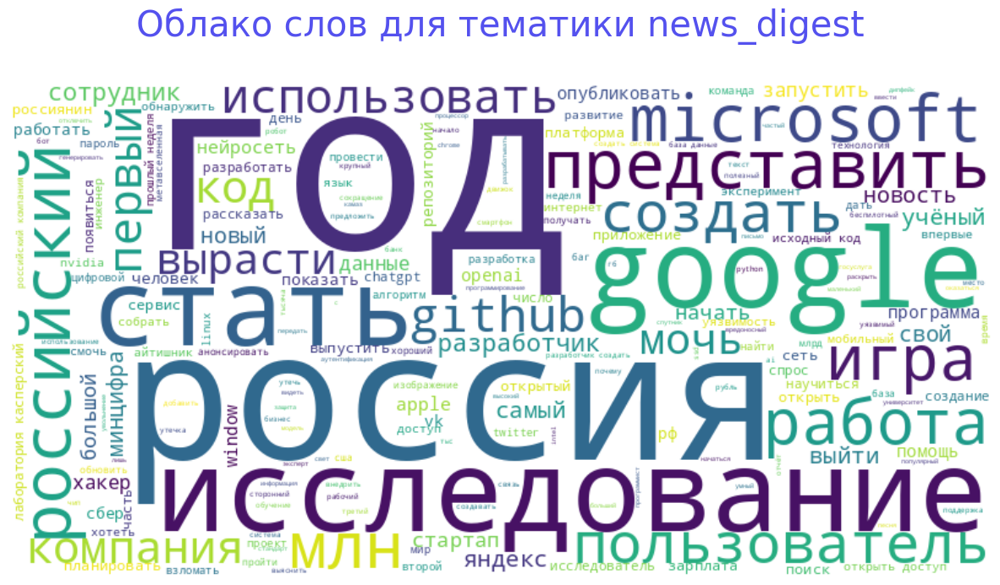

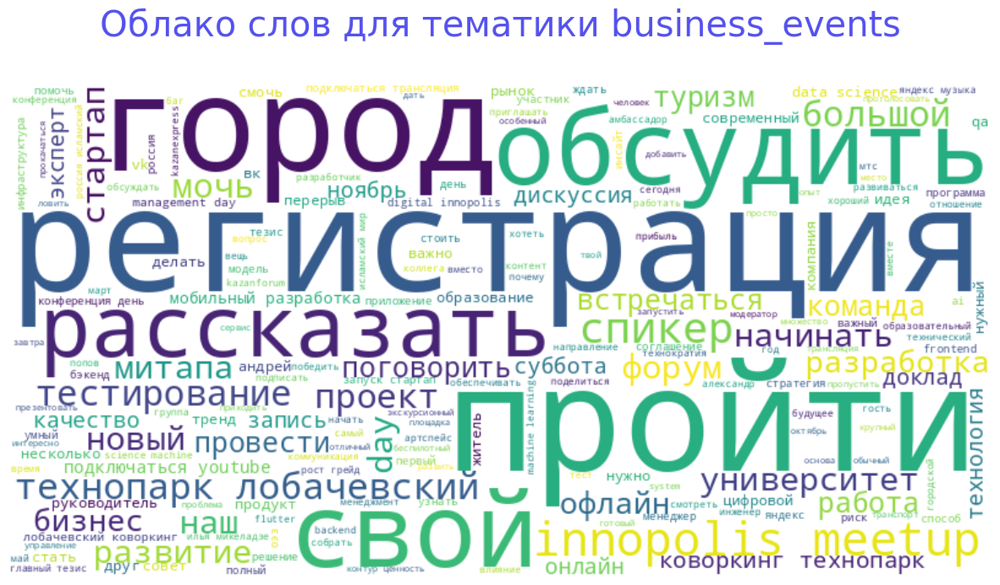

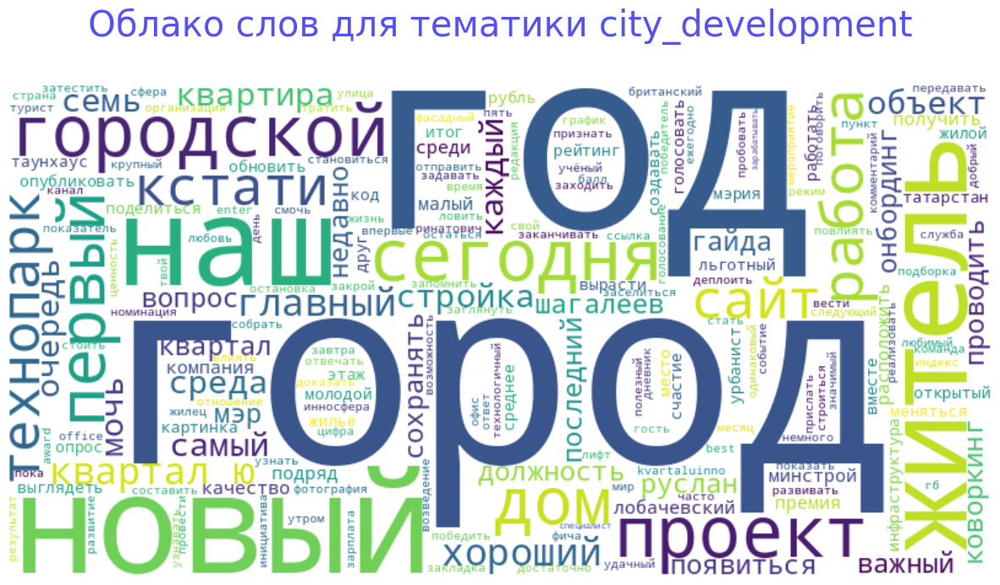

...

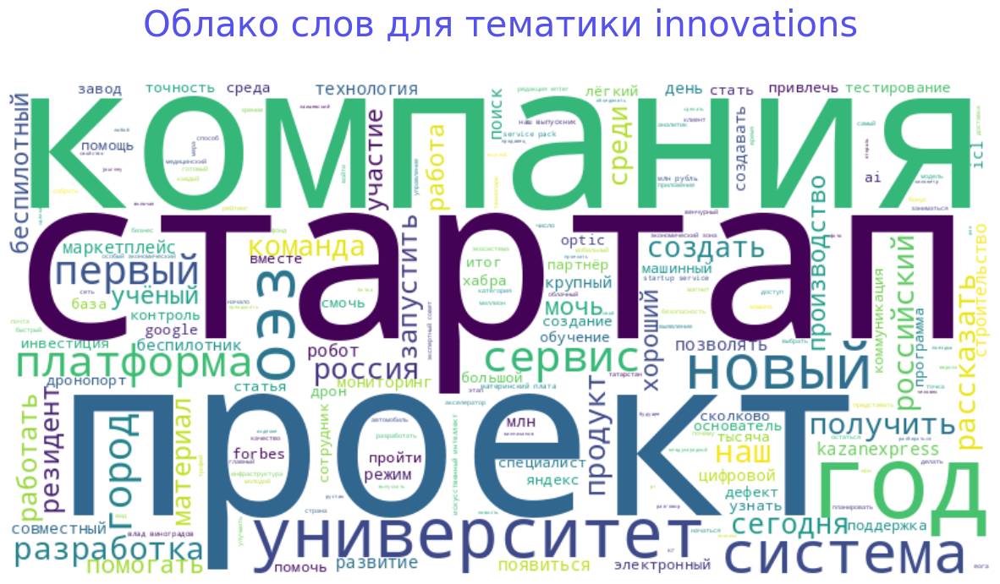

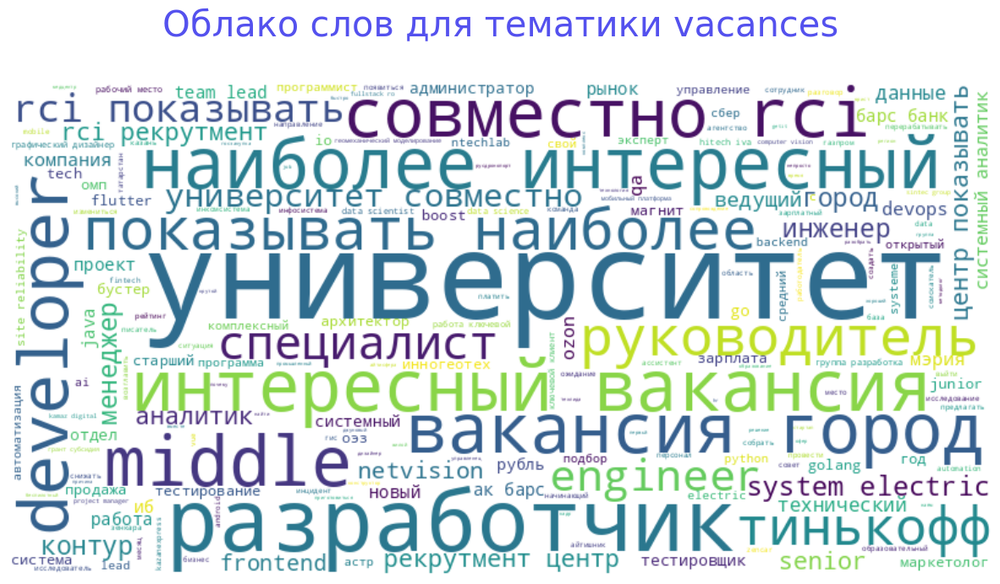

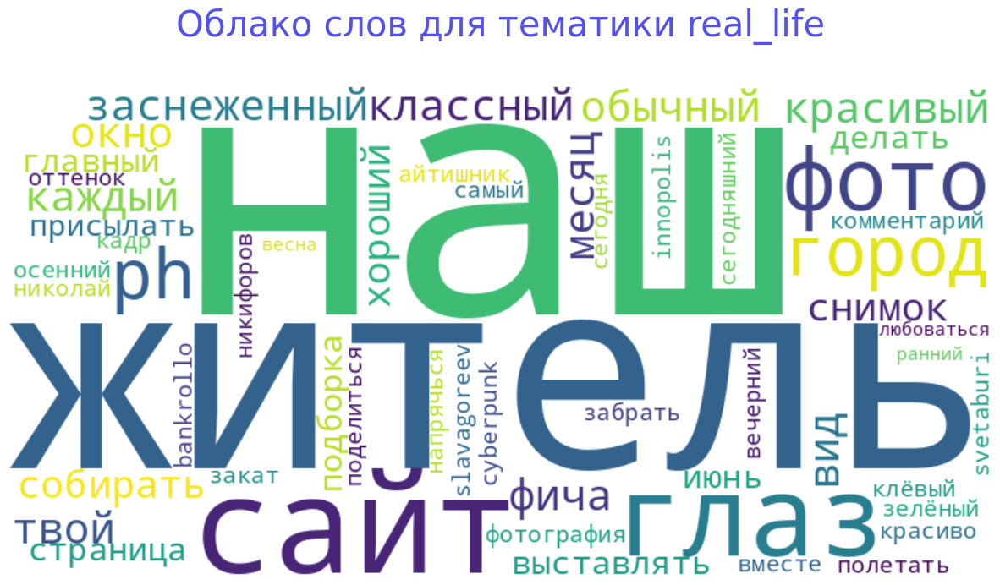

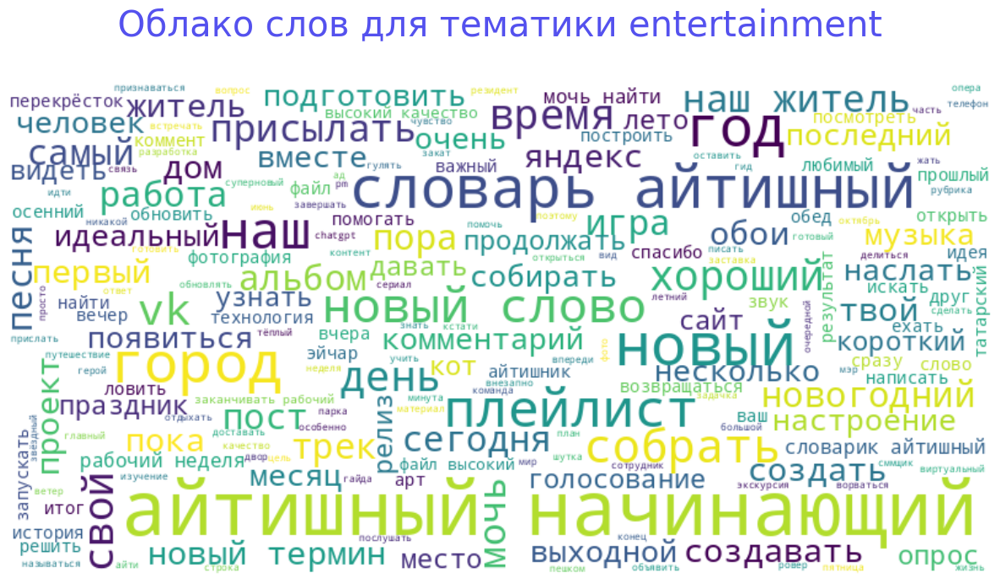

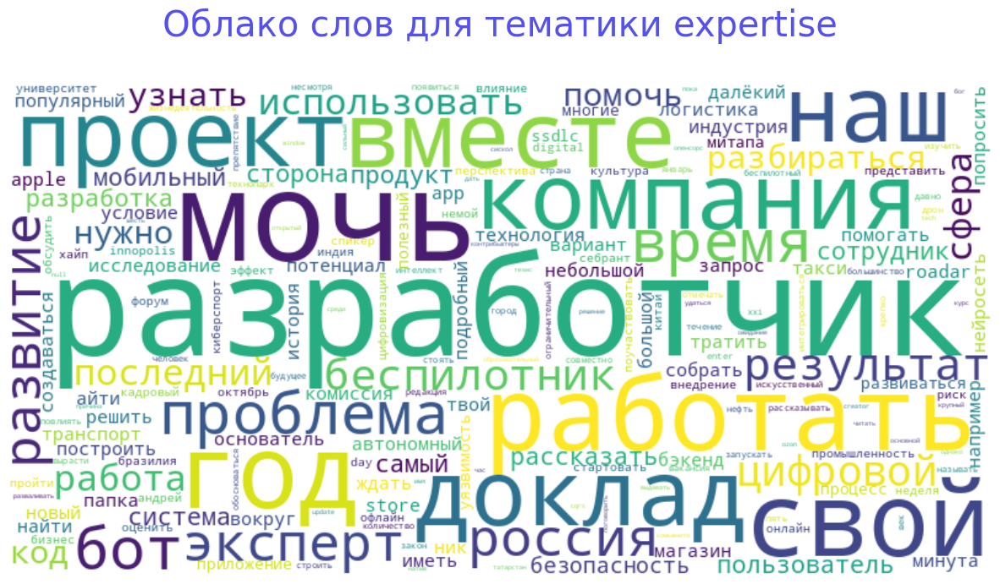

In [80]:
stop_words = set(stopwords.words('russian'))
custom_stop_words = set(['это', 'еще', 'ещё', 'все', 'всё', 'весь','ия', 'также', 'который', 'иннополис'])
stop_words = stop_words.union(custom_stop_words)

morph = pymorphy2.MorphAnalyzer()
lemmatizer = WordNetLemmatizer()

def tokenize_lemmatize_and_filter(text):
    tokens = word_tokenize(text)
    lemmatized_tokens = [lemmatizer.lemmatize(morph.parse(token)[0].normal_form) for token in tokens]
    return [token for token in lemmatized_tokens if token.lower() not in stop_words and token.isalpha()]

for theme in df['theme'].unique():
  #theme = 'entertainment'
  theme_df = df[(df['theme'] == theme)]
  all_text = ' '.join(theme_df['text'].tolist())
  all_text = all_text.lower()

  all_tokens = tokenize_lemmatize_and_filter(all_text)
  text_for_wordcloud = ' '.join(all_tokens)

  wordcloud = WordCloud (width= 800, height = 400, background_color = 'white').generate(text_for_wordcloud)

  plt.figure(figsize = (15,10))
  plt.imshow(wordcloud, interpolation = 'bilinear' )
  plt.axis ('off')
  plt.title(f'Облако слов для тематики {theme}\n', fontsize=30, color = '#5451EE')
  plt.show ()
  print()
  print()

## Оценка сложности текста. Подсчет символов

In [81]:
df['text_len'] =0
text_symbols = r'[а-яА-Яa-zA-Z]' # в тексте поста очень много символов связанных с ссылками, возьмем в обработку только сам текст

for i in range(len( df['text'])):
  try:
    df.loc[i,'text_len'] = len (re.findall (text_symbols, df.loc[i,'text']))
  except: pass


In [82]:
df['text_pmarks_count'] =0
pmarks = r',|:|;|!'

for i in range(len( df['text'])):
  try:
    df.loc[i,'text_pmarks_count'] = len (re.findall (pmarks, df.loc[i,'text'])) - len (re.findall (r'http:', df.loc[i,'text']))
  except: pass

df.head()

,,index,channel,id,date,text,views,reactions_count,comments,type_attachment,...,week,month,year,week_day,hour,reactions_rate,comments_rate,theme,text_len,text_pmarks_count
0,0,5,https://t.me/innopolistg,1421,2023-12-06 12:41:17+00:00,2023 год подходит к концу. И мы вспоминаем сам...,2294.0,45,4,MessageMediaPhoto,...,49,12,2023,2,12,1.96,0.17,celebrate,468,6
1,1,6,https://t.me/innopolistg,1420,2023-12-05 06:01:58+00:00,В поисках новых подарков Дед Мороз заглянул в ...,2116.0,36,6,MessageMediaPhoto,...,49,12,2023,1,6,1.70,0.28,events,250,4
2,2,11,https://t.me/innopolistg,1415,2023-12-04 15:15:49+00:00,В первую неделю зимы слушаем классическую музы...,2175.0,22,3,MessageMediaPhoto,...,49,12,2023,0,15,1.01,0.14,events,146,1
3,3,12,https://t.me/innopolistg,1414,2023-12-04 09:31:49+00:00,1. Университет Иннополис [открыл штаб-квартиру...,2391.0,38,0,MessageMediaPhoto,...,49,12,2023,0,9,1.59,0.00,news_digest,620,10
4,4,19,https://t.me/innopolistg,1407,2023-12-01 14:40:01+00:00,Провели дискуссию о будущем туризма в Иннополи...,2819.0,52,2,MessageMediaPhoto,...,48,12,2023,4,14,1.84,0.07,business_events,382,2


In [83]:
df['text_len'].mean()

372.4211502782931

In [84]:
df['text_pmarks_count'].mean()

5.261595547309833

In [85]:
df[['views','reactions_count',	'comments', 'text_len', 'text_pmarks_count']].corr().round(2)

,views,reactions_count,comments,text_len,text_pmarks_count
views,1.00,0.31,0.19,-0.07,-0.01
reactions_count,0.31,1.00,0.25,-0.42,-0.41
comments,0.19,0.25,1.00,-0.18,-0.18
text_len,-0.07,-0.42,-0.18,1.00,0.87
text_pmarks_count,-0.01,-0.41,-0.18,0.87,1.00


In [86]:
df.groupby('theme').agg({'id': 'count','text_len':'median','reactions_count':'median' }).sort_values(by = 'id', ascending = False)


,id,text_len,reactions_count
theme,,,
entertainment,128,71.5,50.0
news_digest,97,757.0,19.0
events,68,181.5,37.5
business_events,52,397.5,23.5
innovations,51,373.0,44.0
vacances,43,704.0,22.0
university,38,348.5,69.5
city_development,22,222.5,61.0
celebrate,15,133.0,89.0


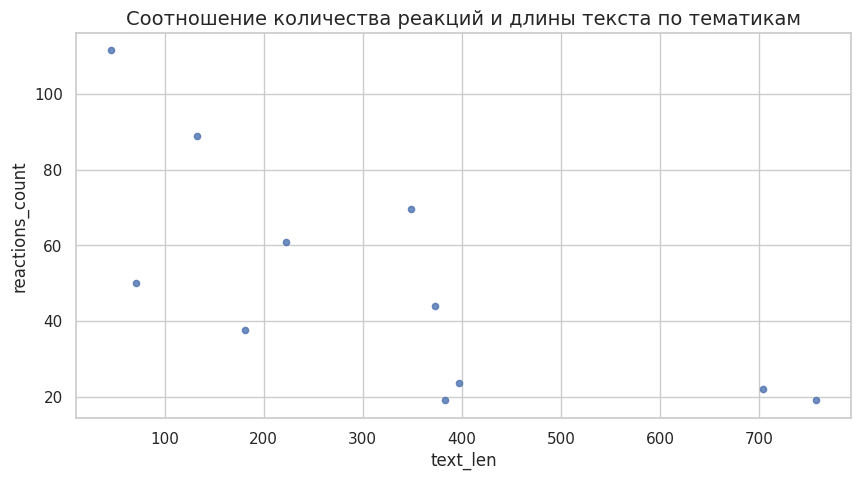

In [87]:
ax = df.groupby('theme').agg({'id': 'count','text_len':'median','reactions_count':'median' }).plot(kind = 'scatter', y='reactions_count', x='text_len', alpha=0.8, figsize = (10,5))
plt.title('Соотношение количества реакций и длины текста по тематикам',  fontsize=14);

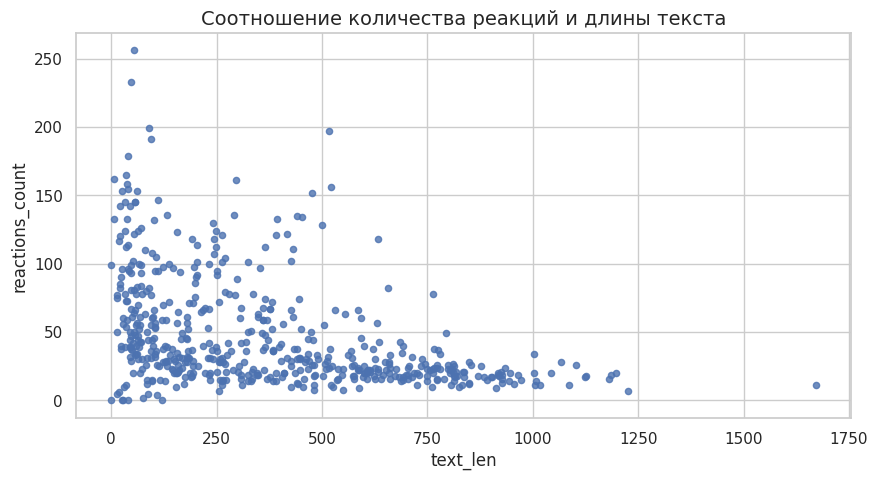

In [88]:
ax =df.plot(kind = 'scatter', y='reactions_count', x='text_len', alpha=0.8, figsize = (10,5));
plt.title('Соотношение количества реакций и длины текста',  fontsize=14);

**Выводы по оценке сложности текста:**

Сложность текста (количество знаков препинания) находится в хорошей корреляции с длинной текста, что логично

Средняя длина текста - около 370 знаков, 5 знаков препинания. Однако в данных есть большой разброс и есть посты более 1000 знаков

Явной корреляции между длиной текста и метриками постов нет, более-менее прослеживается взаимосвязь с реакциями. На графике разброса видно, что посты длиннее 750 знаков имеют низкие реакции. А высокие реакции концентрируются до 500 знаков

Среди тематик ожидаемо самые длинные посты у News_digest и Vacances. Самые лаконичные - у Entertainment и Real_life  - там больше упора на визуал.


## Оценка срока жизни поста

In [89]:
df_comments['date_comment'].min()

Timestamp('2022-04-05 15:05:17+0000', tz='UTC')

In [90]:
df_comments['date_comment'].max()

Timestamp('2023-12-06 14:52:48+0000', tz='UTC')

In [91]:
# для каждого поста отберем комментарии с максимальной датой
last_comment = df_comments.groupby('post_id')['date_comment'].max().reset_index()
last_comment = last_comment.merge(df_comments[['post_id','date_comment','text_comment']], on = ['post_id','date_comment'], how = 'left' )
last_comment.columns = ['id', 'date_last_comment', 'text_comment']
last_comment.head()

,id,date_last_comment,text_comment
0,63,2022-04-14 12:12:03+00:00,Нет =)
1,68,2022-05-05 04:37:53+00:00,А до 2025 года не будет никакого ЖК построено?...
2,74,2022-04-19 08:18:52+00:00,Оставлю тут свой оригинальный комментарий. Пос...
3,81,2023-07-16 16:09:35+00:00,Очень красиво!💞🇷🇺
4,82,2022-04-21 01:18:35+00:00,Уехали из РФ тысячи разрабов. На рынке жесточа...


In [92]:
post_lifetime = df.merge(last_comment, on='id')
post_lifetime ['lifetime'] = (post_lifetime['date_last_comment'] - post_lifetime['date'])
post_lifetime ['lifetime_days'] = (post_lifetime ['lifetime'].dt.total_seconds() / (24*60*60)).round(2) # в количестве дней

In [93]:
post_lifetime ['lifetime_days'].describe()

count    339.000000
mean       9.179587
std       34.936465
min        0.000000
25%        0.170000
50%        1.000000
75%        5.575000
max      452.250000
Name: lifetime_days, dtype: float64

In [94]:
np.percentile(post_lifetime ['lifetime_days'], [90, 95, 99])

array([ 15.882 ,  27.699 , 151.9602])

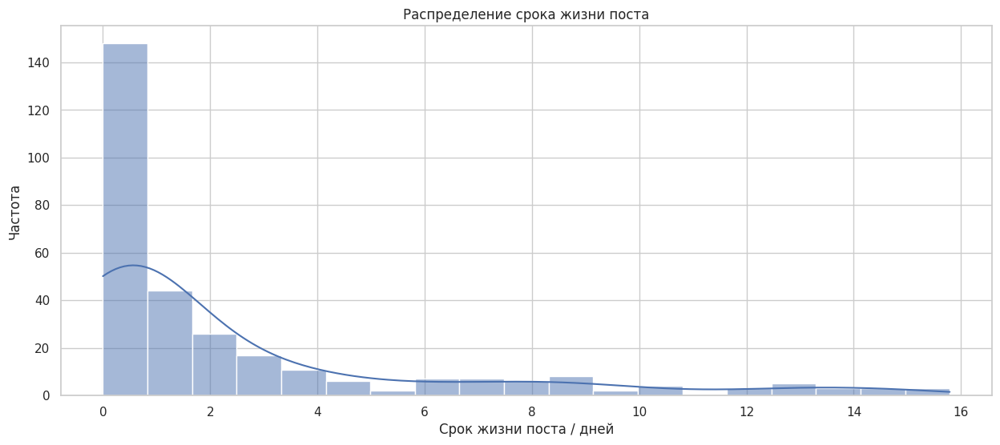

In [95]:

sns.histplot(x='lifetime_days', data=post_lifetime.query('lifetime_days < 15.928') , kde=True)
plt.title('Распределение срока жизни поста')
plt.xlabel('Срок жизни поста / дней')
plt.ylabel('Частота')
plt.show()

In [96]:
post_lifetime.groupby('theme').agg({'id': 'count','lifetime_days':'median' }).sort_values(by = 'id', ascending = False)

,id,lifetime_days
theme,,
entertainment,100,0.990
events,46,1.505
news_digest,41,0.470
vacances,31,8.040
university,27,1.010
business_events,25,0.710
innovations,25,2.140
city_development,19,4.140
celebrate,12,0.215


In [97]:
long_lived_posts = post_lifetime[post_lifetime['lifetime_days'] > float(np.percentile(post_lifetime ['lifetime_days'], [90])) ]['id']
len(long_lived_posts)

34

In [98]:
#pd.options.display.max_colwidth = 1
post_lifetime[post_lifetime['id'].isin(long_lived_posts)][['id','date','text', 'theme','date_last_comment','text_comment','lifetime']].head()

,id,date,text,theme,date_last_comment,text_comment,lifetime
21,1324,2023-11-01 15:21:37+00:00,Ноябрьские обои уже готовы радовать тебя своим...,entertainment,2023-12-06 14:52:48+00:00,"Но там только обои, без календаря..\nИли я не ...",34 days 23:31:11
36,1230,2023-10-03 15:20:36+00:00,"Лови новые обои Иннополиса, которые скрасят тв...",entertainment,2023-11-20 15:17:20+00:00,Спасииибо большое 🥰,47 days 23:56:44
47,1206,2023-09-19 14:36:09+00:00,⚡️**Разработали дрон для контроля дорожного дв...,innovations,2023-11-24 09:30:56+00:00,Эту систему можно быстро развернуть и свернуть...,65 days 18:54:47
73,1104,2023-08-16 14:15:01+00:00,Совместно с RCI показываем наиболее интересные...,vacances,2023-09-05 06:59:48+00:00,Нужны всезнайки))))),19 days 16:44:47
86,1046,2023-07-20 08:46:53+00:00,**В Иннополисе пройдёт гонка дронов с призовым...,events,2023-08-10 10:41:06+00:00,"Подскажите, как согласовать с Администрацией с...",21 days 01:54:13


**Выводы по среднему сроку жизни поста:**

Большая часть постов набирает комментарии в течение суток с момента публикации. однако в распределении есть длинный хвост публикаций более 15 суток (есть более года).
По тематикам: в среднем дольше всего живут посты с Вакансиями. Несмотря на низкие реакции, к этим постам возвращаются и перечитывают.
News_digest - самый короткоживущие посты - полсуток

## Оценка комментариев

In [99]:

pattern_yes = r'хо.*?переех|мечт.*?переех|жду.*?переех|собир.*?переех|перееду|хочу к вам|хоч.*?работ|хот.*?работ|хо.*?поступ|хо.*?учиться|хочу тоже|хот.*?приех|хоч.*?приех|хоч.*?посмотр'
pattern_no = r'боюсь|безразличие|сельчане|ценник|показатели|apple'

def find_matches(text):
  try:
    if bool (re.findall(pattern_yes, text.lower())) == True and bool (re.findall(pattern_no, text.lower())) == False :
      return 'wish_to_move'
    else:
      return 'no'
  except:
        pass

df_comments['has_match'] = df_comments['text_comment'].apply(find_matches)

df_comments[df_comments['has_match'] == 'wish_to_move'].count()


                34
post_id         34
date_comment    34
text_comment    34
has_match       34
dtype: int64

In [100]:
wish_to_move_posts = df_comments.loc[df_comments['has_match'] == 'wish_to_move', 'post_id' ].unique()
wish_to_move_posts

array([1395, 1377, 1272, 1230, 1175, 1120,  961,  910,  905,  883,  865,
        861,  808,  782,  751,  728,  708,  680,  679,  673,  627,  528,
        313,  193,  177,  176,  114,   63])

In [101]:
df[df['id'].isin (wish_to_move_posts)].groupby('theme')['id'].count().sort_values(ascending=False)

theme
entertainment       9
vacances            5
city_development    4
business_events     2
events              2
news_digest         2
university          2
celebrate           1
innovations         1
Name: id, dtype: int64

In [102]:
df_move_comments = df_comments[df_comments['has_match'] == 'wish_to_move'][['post_id','text_comment']].reset_index(drop = True)
df_move_comments.columns = ['id', 'text_comment']
df_move_comments.head()

,id,text_comment
0,1395,Хотелось бы к вам приехать) Занимаюсь профорие...
1,1377,"Мне бы хотелось, у Вас работать дворником, что..."
2,1272,Очень Хочу к вам переехать. Но квартир в аренд...
3,1230,"я так хочу к вам снова, позавчера была экскурс..."
4,1175,"Добрый день. Подскажите, есть ли в Иннополисе ..."


In [103]:
# pd.options.display.max_colwidth = 1
df_move_comments = df_move_comments.merge(df[['theme','id','date','text','views','reactions_count','comments']], on = 'id')
df_move_comments.query('id == 708')

,id,text_comment,theme,date,text,views,reactions_count,comments
18,708,"Здравствуйте,я хочу поступить в лицей Иннополи...",entertainment,2023-01-31 10:02:24+00:00,PM vs PM\n\nПора это остановить — создаём **пр...,3219.0,37,8


**Выводы по комментариям:**

Всего в базе было найдено 34 комментария от тех, кто высказывает желание переехать, поступить на работу или на учебу в Иннополисе.
Больше всего таких комментариев собирают посты Развлекательной тематики

В будущем не рекомендуем использовать анализ комментариев для выводов по готовности к переезду, и о влиянии постов:

*   такие комментарии носят импульсивный характер, и не обязательно связаны с реальным намерением переехать.
*   выбор места жительства/работы/учебы не является импульсным решением, и формируется долгосрочно, являясь результатом влияния канала целиком, а не отдельного поста. Нужны другие метрики для оценки влияния на желания переезда.
*   по наблюдениям, большая часть комментариев не связана с темой публикации. кажется, что человек хотел задать вопрос, и просто написал его в последнем опубликованном посте



## Анализ emoji

In [104]:
parsed_data = pd.DataFrame(columns=['id', 'date', 'emoji', 'cnt_emoji'])

def parse_reactions(row):
    parsed_rows = []
    try:
        reactions = ast.literal_eval(row['reactions'])
        for reaction in reactions['results']:
            emoji = reaction['reaction'].get('emoticon', None)
            count = reaction['count']
            parsed_rows.append({'id': row['id'], 'date': row['date'], 'emoji': emoji, 'cnt_emoji': count})
    except Exception as e:
        print(f"Error: {e}")
    return parsed_rows

parsed_data_list = []
for index, row in df.iterrows():
    parsed_rows = parse_reactions(row)
    parsed_data_list.extend(parsed_rows)

parsed_data = pd.concat([parsed_data, pd.DataFrame(parsed_data_list)], ignore_index=True)

parsed_data['date'] = pd.to_datetime(parsed_data['date'])

Error: invalid syntax (<unknown>, line 0)
Error: invalid syntax (<unknown>, line 0)
Error: invalid syntax (<unknown>, line 0)
Error: invalid syntax (<unknown>, line 0)
Error: invalid syntax (<unknown>, line 0)


In [105]:
parsed_data['emoji'] = parsed_data['emoji'].fillna('innp')
parsed_data.head()

,id,date,emoji,cnt_emoji
0,1421,2023-12-06 12:41:17+00:00,🔥,25
1,1421,2023-12-06 12:41:17+00:00,innp,5
2,1421,2023-12-06 12:41:17+00:00,👍,4
3,1421,2023-12-06 12:41:17+00:00,❤,4
4,1421,2023-12-06 12:41:17+00:00,👏,3


In [106]:
parsed_data['emoji'].unique()

array(['🔥', 'innp', '👍', '❤', '👏', '👎', '🏆', '🆒', '😎', '❤\u200d🔥', '🎄',
       '💯', '👀', '🥰', '🍓', '💘', '✍', '🎅', '🎉', '😍', '🦄', '☃', '⚡', '🤣',
       '😁', '🍾', '🤔', '🤝', '🌚', '🐳', '🗿', '😐', '👻', '👾', '👨\u200d💻', '👌',
       '🤓', '😈', '🙏', '🤗'], dtype=object)

In [107]:
parsed_data.groupby('emoji')['cnt_emoji'].agg(['count', sum]).sort_values(by = 'sum' ,ascending=False).head()


,count,sum
emoji,,
🔥,370,6189
👍,496,5425
❤,372,5247
❤‍🔥,119,1662
👏,184,1039


In [108]:
# Добавляем количество эмодзи по категориям эмоциональности

positive = ['👍', '🤗','❤‍🔥','😍','🥰','😁','👌','👏','🔥','💘','❤','🆒','innp']
negative = ['👎', '🤔','😐','😈']  # резко негативные смайлики почти отсутствуют, для анализа д
neutral = ['🌚','🐳','🤣','🎉','🍾','🏆','👨‍💻','🍓','🦄','👾','✍','🙏','🎄','☃','🎅','🗿','👻','🤝','😎','🤓','👀','💯','⚡']

parsed_data['emoji_category'] = 'undef'
parsed_data.loc[parsed_data['emoji'].isin(positive), 'emoji_category'] = 'positive'
parsed_data.loc[parsed_data['emoji'].isin(negative), 'emoji_category'] = 'negative'
parsed_data.loc[parsed_data['emoji'].isin(neutral), 'emoji_category'] = 'neutral'


parsed_data.head()

,id,date,emoji,cnt_emoji,emoji_category
0,1421,2023-12-06 12:41:17+00:00,🔥,25,positive
1,1421,2023-12-06 12:41:17+00:00,innp,5,positive
2,1421,2023-12-06 12:41:17+00:00,👍,4,positive
3,1421,2023-12-06 12:41:17+00:00,❤,4,positive
4,1421,2023-12-06 12:41:17+00:00,👏,3,positive


In [109]:
df_emoji = parsed_data.pivot_table(index = 'id', columns = 'emoji_category', values = 'cnt_emoji', aggfunc = 'sum').fillna(0).reset_index()
#df_emoji ['total_emoji'] =df_emoji ['negative'] + df_emoji ['neutral']+ df_emoji ['positive']
df_emoji = df_emoji.merge(df [['reactions_count','id', 'date', 'text', 'theme' ]], on = 'id')
df_emoji['negative_index'] =  (df_emoji['negative']/df_emoji['reactions_count']*100).round(2)
df_emoji['positive_index'] =  (df_emoji['positive']/df_emoji['reactions_count']*100).round(2)

In [110]:
df_emodji_avg = parsed_data.groupby('emoji_category')['cnt_emoji'].sum().reset_index()
df_emodji_avg ['emodzi_share'] = df_emodji_avg ['cnt_emoji']/df['reactions_count'].sum()
df_emodji_avg

,emoji_category,cnt_emoji,emodzi_share
0,negative,721,0.028229
1,neutral,3381,0.132375
2,positive,21439,0.839395


In [111]:
df_emoji_negative = df_emoji['negative'].sum()/df_emoji['reactions_count'].sum()*100
df_emoji_positive = df_emoji['positive'].sum()/df_emoji['reactions_count'].sum()*100
df_emoji_positive = df_emoji['neutral'].sum()/df_emoji['reactions_count'].sum()*100

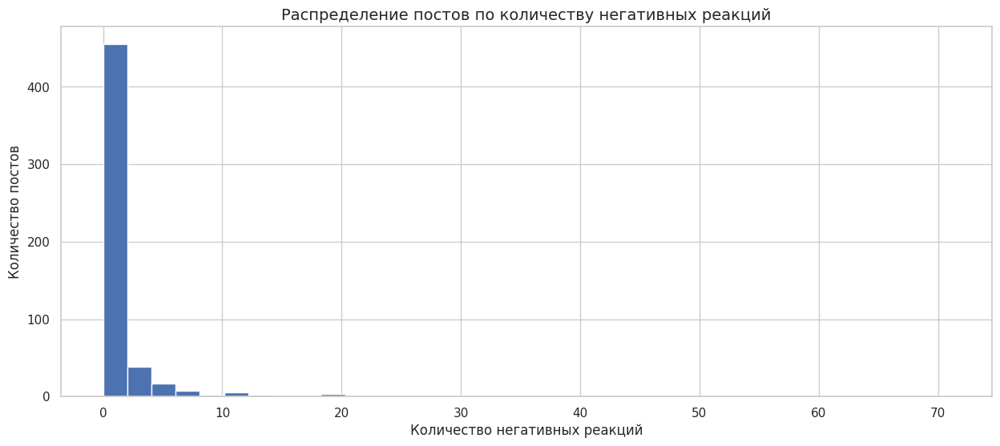

In [112]:
df_emoji['negative'].hist(bins = 35)
plt.title('Распределение постов по количеству негативных реакций',  fontsize=14)
plt.xlabel('Количество негативных реакций')
plt.ylabel('Количество постов');

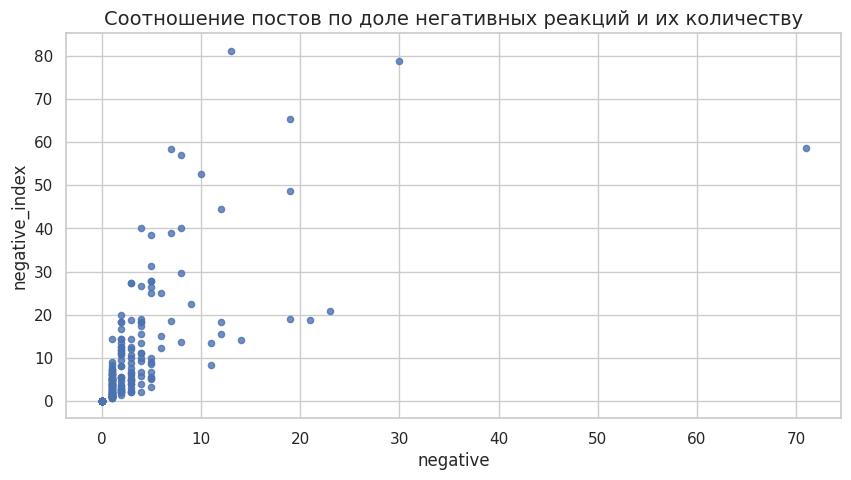

In [113]:
df_emoji.plot(kind = 'scatter', y='negative_index', x='negative', alpha=0.8, figsize = (10,5))
plt.title('Соотношение постов по доле негативных реакций и их количеству',  fontsize=14);

In [114]:
df_emoji.loc [(df_emoji['negative_index'] > df_emoji_negative) &(df_emoji['negative'] >= 10)].sort_values(by = 'negative',ascending = False)

,id,negative,neutral,positive,reactions_count,date,text,theme,negative_index,positive_index
488,1283,71.0,8.0,42.0,121,2023-10-19 09:35:37+00:00,Сегодня в Иннополисе только и разговоров что о...,innovations,58.68,34.71
63,162,30.0,1.0,7.0,38,2022-06-02 14:46:30+00:00,Айтишники напряглись. [@bankrollo](https://t.m...,real_life,78.95,18.42
335,838,23.0,2.0,85.0,110,2023-04-19 09:20:01+00:00,[Университет Иннополис](https://t.me/universit...,university,20.91,77.27
149,401,21.0,6.0,85.0,112,2022-09-12 11:15:01+00:00,"Кстати, новые корпуса будут выглядеть так",city_development,18.75,75.89
80,202,19.0,0.0,20.0,39,2022-06-17 15:10:05+00:00,Новый термин в словаре «айтишный для начинающи...,entertainment,48.72,51.28
127,335,19.0,58.0,23.0,100,2022-08-15 16:00:31+00:00,Решили поддержать идею ~~Wildberries~~ Ягодки ...,entertainment,19.00,23.00
276,711,19.0,2.0,8.0,29,2023-02-01 15:15:53+00:00,"Признаёмся, ChatGPT написал не только этот пос...",entertainment,65.52,27.59
138,366,14.0,20.0,65.0,99,2022-08-31 21:01:57+00:00,🍂,entertainment,14.14,65.66
85,220,13.0,0.0,3.0,16,2022-06-24 08:55:58+00:00,Тут [Нетфликс объявил](https://www.theguardian...,news_digest,81.25,18.75
92,237,12.0,0.0,54.0,66,2022-06-30 15:50:30+00:00,[ОЭЗ «Иннополис»](https://t.me/sez_innopolis_i...,vacances,18.18,81.82


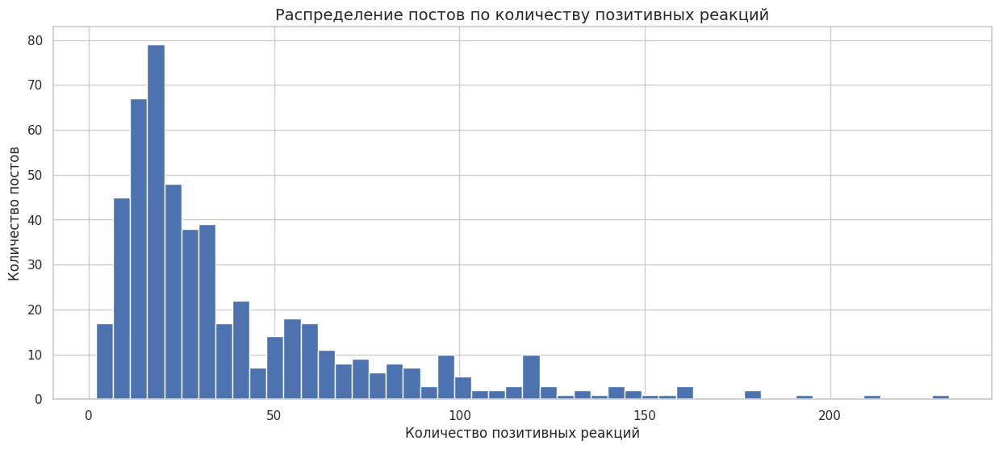

In [115]:
df_emoji['positive'].hist(bins = 50)
plt.title('Распределение постов по количеству позитивных реакций',  fontsize=14)
plt.xlabel('Количество позитивных реакций')
plt.ylabel('Количество постов');

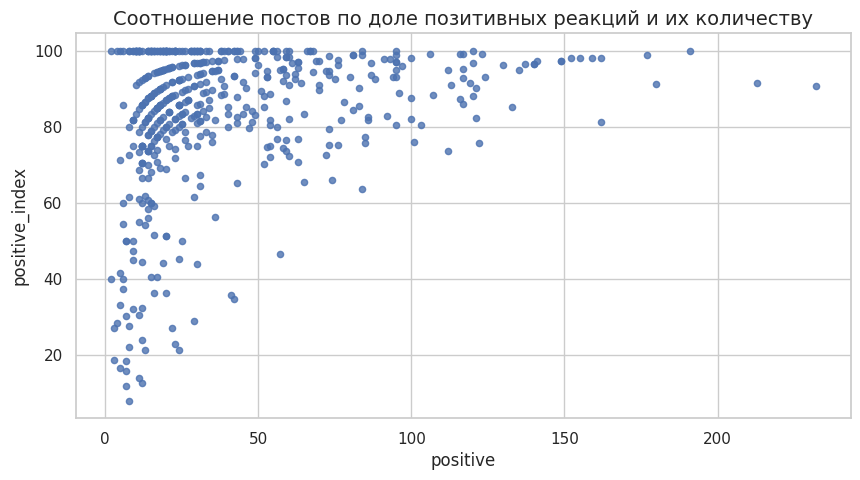

In [116]:
df_emoji.plot(kind = 'scatter', y='positive_index', x='positive', alpha=0.8, figsize = (10,5))
plt.title('Соотношение постов по доле позитивных реакций и их количеству',  fontsize=14);

**Выводы по Эмодзи:**

В канале преобладают позитивные реакции - 84%. Негативных эмодзи на канале крайне мало - не более 3%.

При этом, есть посты с высокой долей негативных реакций.
Большая часть таких постов в целом имеет мало реакций, и в абсолютном значении негативных реакций так же мало.
Но выделяются посты с большим количество негатива как в доле, так и в абсолютном значении. Их не очень много, но на них стоит обратить внимание.
Среди них преобладают посты Развлекательной тематики - это в целом не вызывает тревоги, так как чувство юмора у всех разное, и не все шутки "заходят" всем.
Так же среди негативных реакций есть Новостные дайджесты - это могут быть реакции на конкретные новости, и они не связаны с негативом к Иннополису.

Есть 2 поста, на которые стоит обратить внимание:
- изменения логотипа Университета
- новости по застройке новых корпусов.
Не все люди благосклонно воспринимают перемены, есть негативисты по жизни. Необходимо учитывать такие реакции при публикации постов с новостями, работать с негативом. Возможно, пересмотреть формат подачи таких новостей, в качестве профилактики негатива в будущем


##  Итоговые выводы по проекту

В ходе проведенного анализа были выведены основные KPI метрик канала по среднему количеству просмотра поста (4650), reaction_rate (1.2%) и comment_rate (0.11%). Был сформулирован прогноз по динамике роста канала на будущий период, основываясь на текущих данных (+ 30%). Данные KPI даны при условии продолжения текущей стратегии наполнения и продвижения канала.

Так же были даны рекомендации по направлениям для дополнительной оптимизации, среди которых основными инструментами являются:

*   Оптимизация подхода к тематикам: минимизировать News_digest, развивать - Real_life. В целом больше упор на внутреннюю жизнь и новости самого Иннополиса
*   Оптимизация выхода постов по тайм-слотам: перераспределить посты с понедельника на четверг - пятницу. Тестировать рубрику по выходным.

Так же важно отслеживать наличие негатива в реакциях к постам: как общую долю негатива (текущий уровень низкий - не превышает 3%), так и отдельных постов. Это может быть индикатором снижения лояльности. С негативом необходимо работать как по факту, так и заниматься его профилактикой.